# Which countries produce the most carbon per capita?
What are their characteristics? 
How does this change by continent? 
Where is it increasing and descreasing at the fastest rate?

In [258]:
# load packages
import numpy as np
import pandas as pd
import pprint as pp

import matplotlib.pyplot as plt
%matplotlib inline

# to use seaborn styling in matplotlib plots
import seaborn as sns
sns.set()

# to display offline interactive plots
import plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

# cufflines binds plotly to pandas DFs
import cufflinks as cf
import plotly.tools as tls

# to scale heatmaps
from sklearn import preprocessing

tls.embed('https://plot.ly/~cufflinks/8')
cf.set_config_file(offline=True, world_readable=False, theme='ggplot')

## Why look at CO2?

In case you've been hiding under a rock, the earth is getting warmer on average, with dramatic repurcussions: heatwaves in northern Europe; a longer more lethal forest fire season in California; more frequent and intense hurricanes in the Gulf of Mexico and Carribbean, and ditto for typhoons in the south Pacific. The list goes on.

Already, we are seeing how an inability to make a living due to climate change is prompting some people to migrate, which in turn is being magnified and exagerated by political leaders wanting to stir-up fear and create easy scapegoats for complex problems. As more people get displaced by climate-related events that wipe out crops or even entire towns, this cycle will only intensify. 

Science has established a causal link to the dramatic spike in greenhouse gas emissions since the industrial revolution, the most significant of which being carbon dioxide, or CO2.

The two plots below speak for themselves. While the scale is different (temperature variations in Celsius vs. 1000 metric tonnes), the curve is nearly identical.

From https://climate.nasa.gov/vital-signs/global-temperature/ :

_"This graph illustrates the change in global surface temperature **relative to 1951-1980 average temperatures**. Seventeen of the 18 warmest years in the 136-year record all have occurred since 2001, with the exception of 1998. **The year 2016 ranks as the warmest on record**. (Source: NASA/GISS)."_ (Emphasis mine)

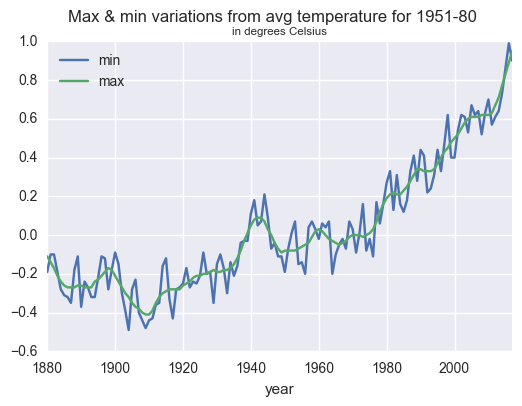

In [84]:
# load historical temperature variation data

url = 'https://climate.nasa.gov/system/internal_resources/details/original/647_Global_Temperature_Data_File.txt'
temps = pd.read_csv(url, sep= '\t', header=None)

temps.rename(columns={0:'year', 1:'min', 2:'max'}, inplace=True)
temps.set_index('year', inplace=True)

temps.plot()
plt.suptitle('Max & min variations from avg temperature for 1951-80')
plt.title('in degrees Celsius', fontsize='x-small');

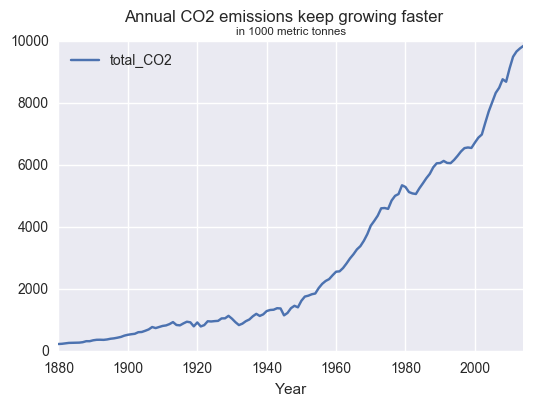

In [85]:
# Compare with global CO2 total *annual* (not cumulative!) emissions

# Global state of CO2
url = 'http://cdiac.ess-dive.lbl.gov/ftp/ndp030/CSV-FILES/global.1751_2014.csv'
df = pd.read_csv(url)
df.drop(0, inplace=True)
df = df.iloc[:,0:2].astype(int).set_index('Year')
colname = df.columns[0]
df.rename(columns = {colname:'total_CO2'}, inplace=True)

# plot same for same timeframe as temp data
df.loc[1880:].plot();
plt.suptitle('Annual CO2 emissions keep growing faster')
plt.title('in 1000 metric tonnes', fontsize='x-small');

All this is important, but also depressing and scary. The numbers are so big they are hard to grasp, and unless you've been hiding under the aforementioned rock, you've probably seen so many variations of these graphics that they've become just another part of the media landscape.

That certainly was the case for me. 

So this report is my attempt to get a handle on what is going on with carbon emissions by manipulating it myself instead of consuming it passively online.

## Load per capita CO2 data

While the previous plot showed global annual CO2 emissions world wide, I'll start by analyzing *per capita* CO2 emissions by country and year, and then introduce additional data columns.


**Note about data wrangling**: the csv file used here is the result of merging multiple data sources. It required an INSANE amount of data wrangling. So much so that to include it all here would disrupt the flow of the analysis. Instead, I've documented the process in another notebook, `make_df_nov18.ipynb`.



In [1796]:
mypath = 'data/final_nov18/'

filename = 'final_df.csv'
df = pd.read_csv(mypath + filename)

# assign name attribute to df
df.name = filename.split('_')[0]
df.head()

,country,region,sub-region,year,CO2_pc,energy_use_pc,energy_production_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
0,Afghanistan,Asia,Southern Asia,1949,0.00182,NaN,NaN,NaN,1030.0,NaN,NaN,NaN,NaN
1,Afghanistan,Asia,Southern Asia,1950,0.01088,NaN,NaN,NaN,1040.0,NaN,NaN,7752118.0,NaN
2,Afghanistan,Asia,Southern Asia,1951,0.01169,NaN,NaN,NaN,1060.0,NaN,NaN,7839426.0,NaN
3,Afghanistan,Asia,Southern Asia,1952,0.01155,NaN,NaN,NaN,1070.0,NaN,NaN,7934798.0,NaN
4,Afghanistan,Asia,Southern Asia,1953,0.01323,NaN,NaN,NaN,1120.0,NaN,NaN,8038312.0,NaN


In [1797]:
# for now, just focus on annual CO2 & regions columns
val = 'CO2_pc'
co2_df = df.iloc[:,:5]
co2_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 5 columns):
country       17055 non-null object
region        17055 non-null object
sub-region    17055 non-null object
year          17055 non-null int64
CO2_pc        17055 non-null float64
dtypes: float64(1), int64(1), object(3)
memory usage: 666.3+ KB


## About the data

Average CO2 (or CO?) emission in metric tons per person during the given year, calculated from converting C to CO2 (C * 3.67), then dividing the total population of the countries.

https://docs.google.com/spreadsheets/d/1RjqGm7RG82GGVf7E4RXPPwFF7O1So6T0SFx2fVfcUJA/pub?range=A1:D70&gid=1&output=html#

country, year, CO2: Pre-1950, based on historical calculations that tabulate coal, brown coal, peat, and crude oil production by nation and year. 1950 onwards, Fossil-Fuel Burning (liquid, gas & solid), Cement Manufacture, and Gas Flaring. http://cdiac.ess-dive.lbl.gov/trends/emis/meth_reg.html

region & sub-region: These lists are the result of merging data from two sources, the Wikipedia ISO 3166-1 article for alpha and numeric country codes, and the UN Statistics site for countries' regional, and sub-regional codes. In addition to countries, it includes dependent territories. https://github.com/lukes/ISO-3166-Countries-with-Regional-Codes



## Helper Functions

In [89]:
def assign_name(row):
    df = row['df']
    df.name = row['labels']
    
def facetize_df(df, facet):
    """
    Splits df into list of smaller dfs for each categorical value
    """
    facet_dfs = [df.loc[df[facet]==f] for f in df[facet].unique()]
    facet_list = [f for f in df[facet].unique()]
    
    facet_dfs = pd.DataFrame({'df': facet_dfs, 'labels': facet_list})
    
    #facet_dfs = facet_dfs.apply(assign_name, axis=1)
    return facet_dfs


### Plotly

In [90]:
# create category levels for a column
def cut_column(df, col):
    level = pd.qcut(df[col].fillna(0), 4, \
                  duplicateds = 'drop', \
                   labels = ['1 low %s' % col, '2 med %s' % col, '3 high %s' % col, '4 very high %s' % col])
    df[col] = level
    return df

# generic bubble plot, categorized by region
def plot_bubble(df, col, cut_by):
    #categories = cut_by
    df.iplot(kind='bubble', x=x, y=y, size=size, text='country',\
           xTitle=str.title(x), yTitle=y, categories=cut_by, \
             title= '%s vs %s for %s (%s)' % (x.upper(), y.upper(), q.upper(), yr))

# bubble plot with, categorized by 'col' levels
def plot_bubble_with_cuts(df, col, cut_by='region'):
    if cut_by:
        cut_df = cut_column(df.copy(), cut_by)
        #return cut_df.head()
        plot_bubble(cut_df, col, cut_by)
    else:
        pass
        
        #plot_bubble(df, col)
        


## Explore data

### Global view of `CO2_pc`


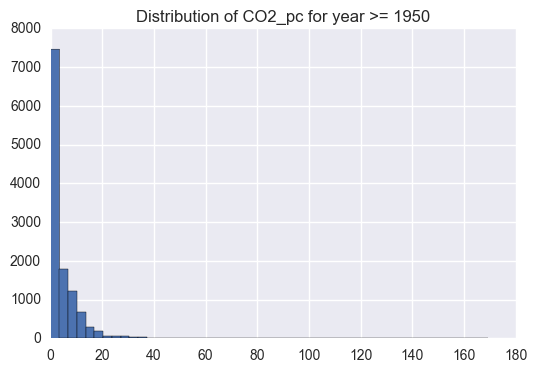

In [1903]:
# CO2 dist since 1950
q = "year >= 1950"

co2_df.query(q)[val].hist(bins=50)
plt.title('Distribution of %s for %s' % (val, q)); 

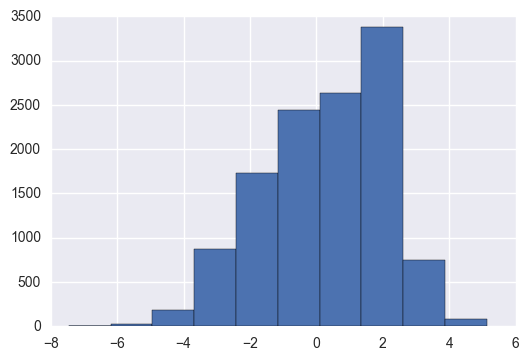

In [265]:
# log transform this long-tailed data
co2_df.query(q)[val].apply(np.log)\
    .replace([np.inf, -np.inf], np.nan).hist(bins=10);

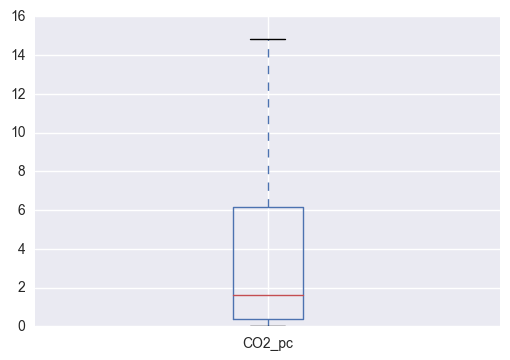

In [1832]:
# boxplot without outliers
co2_df.query(q)[val].plot(kind='box', showfliers = False);

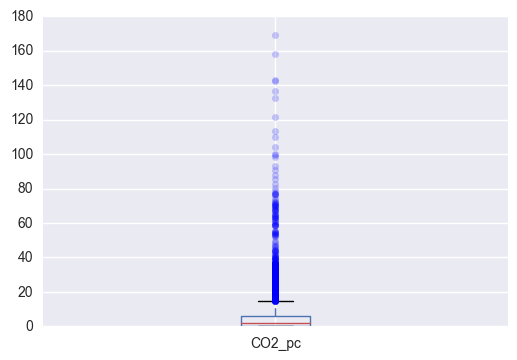

In [1834]:
# boxplot with outliers

# set style for showing outliers
flierprops = dict(marker='o', markersize=5, alpha=0.2)

co2_df.query(q)[val].plot(kind='box', flierprops = flierprops);

There are some extremely high outliers going on here.

In [1905]:
# stats
co2_df.query(q).drop('year', axis=1).describe().round(2)

,CO2_pc
count,11981.00
mean,4.61
std,8.45
min,0.00
25%,0.36
50%,1.63
75%,6.16
max,169.13


### Top & bottom 10 emitters

In [95]:
# top 10 co2 per cap. emitters for most recent year
max_yr = co2_df['year'].max()
q = "year == @max_yr"

co2_df.query(q)[['country',val, 'sub-region']].sort_values(val, ascending=False).head(10)

,country,CO2_pc,sub-region
12154,Qatar,40.45868,Western Asia
15241,Trinidad And Tobago,34.51710,Caribbean
3729,Cura Ao,34.05183,Caribbean
8443,Kuwait,27.25649,Western Asia
1109,Bahrain,23.68042,Western Asia
2097,Brunei,18.91702,South-Eastern Asia
15662,United Arab Emirates,18.70654,Western Asia
8875,Luxembourg,18.64675,Western Europe
5073,Falkland Is Malvinas,18.06240,South America
12795,Saudi Arabia,17.92586,Western Asia


In [96]:
# bottom 10 co2 per cap. emitters for most recent year
co2_df.query(q)[['country',val, 'sub-region']].sort_values(val, ascending=False).tail(10)

,country,CO2_pc,sub-region
4947,Ethiopia,0.11245,Eastern Africa
10710,Niger,0.10685,Western Africa
9078,Malawi,0.07859,Eastern Africa
12589,Rwanda,0.07215,Eastern Africa
2869,Central African Republic,0.06305,Middle Africa
9220,Mali,0.06188,Western Africa
13357,Somalia,0.06071,Eastern Africa
2924,Chad,0.04630,Middle Africa
3412,Congo Dem Rep,0.03831,Middle Africa
2340,Burundi,0.02803,Eastern Africa


Top CO2 per capita emitters are either:
* oil-producing countries (no suprise).
* tiny ountries like Luxembourg & Curaçao (surprise).

And while the big emitters can be found across the world, the lowest emitters are all in Africa.

### `CO2_pc` by region

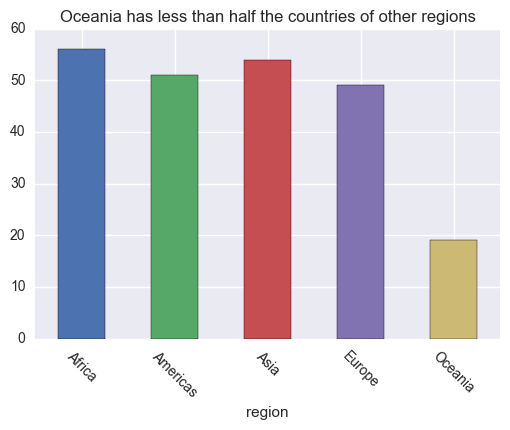

In [1402]:
# How many countries in each region?
co2_df.groupby('region')['country'].nunique().plot(kind='bar', rot=-45)
plt.title('Oceania has less than half the countries of other regions');

In [94]:
# country counts by region
co2_df.groupby(['region'])['country'].nunique().sort_values()

region
Oceania     19
Europe      49
Americas    51
Asia        54
Africa      56
Name: country, dtype: int64

#### Distributions

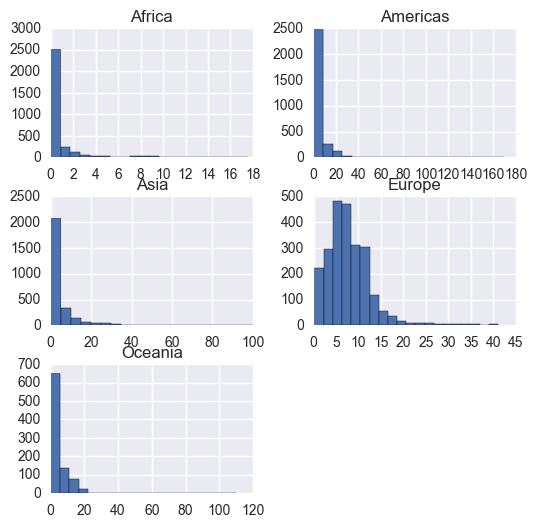

In [97]:
# dist by region
q = "year >= 1950"
co2_df.query(q).sort_values('region').set_index(['region', 'sub-region','country','year'])\
    .unstack(level=(0))[val]\
    .hist(bins=20, figsize=(6,6));

Interestingly, only Europe has a quasi-normal distribution. Everywhere else has extremely negatively-skewed distributions.

The longest tail appears to be in the Americas, to judge by the x-axis range.

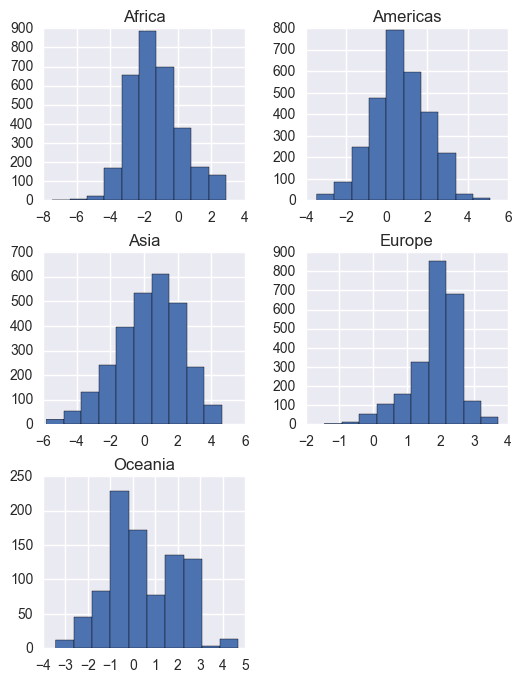

In [98]:
# apply natural log transform on CO2_pc
log_co2 = co2_df.query(q).sort_values('region').set_index(['region', 'sub-region','country','year'])\
    .unstack(level=0)[val].apply(np.log)
    
# replace numpy infinite values with nans
log_co2.replace([np.inf, -np.inf], np.nan)\
    .hist(bins=10, figsize=(6,8));


The distribution of the log `CO2_pc` values becomes normal except for: 
* Europe, which has a slight positive skew.
* Oceania, which appears to be bi-modal.

#### Where are the outliers?

In [1892]:
## helper function
def make_regional_boxplot(df, facet, showfliers):
    '''facets dataframe and shows boxplot for
    each facet, with title'''
    df.boxplot(by=facet, showfliers = showfliers, flierprops = flierprops, rot=45)
    plt.title(df['region'].unique())
    plt.show();

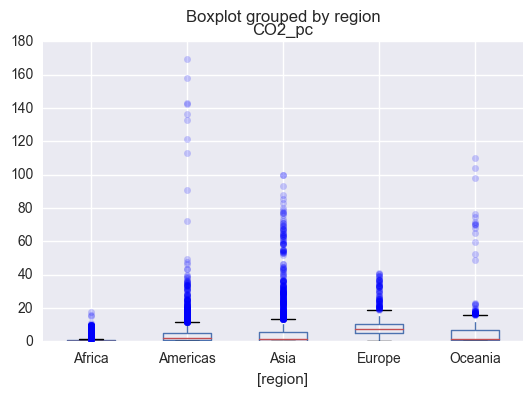

In [1835]:
# boxplots by region
q = "year >= 1950"
co2_df_box = co2_df.query(q).sort_values(['region', 'sub-region'])\
    .set_index(['region', 'sub-region','country','year'])[val].reset_index(level=(0,1))
                                                                        
co2_df_box.boxplot(by='region', flierprops = flierprops);

* Asia seems to have the most outliers, although hard to be certain.
* Americas looks like it's the most extreme.
* Europe seem to have the least-extreme outliers.
* Africa's boxplot looks like it's nearly as tight as Europe's but if the mean is hovering near 0 while the top outlier is nearly 20, then it may be the continent with the most extreme outliers. 

#### Compare IQRs

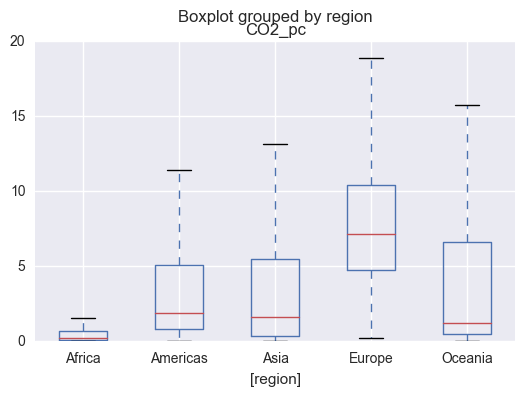

In [1838]:
# Focus on the boxes, hide outliers
co2_df_box.boxplot(by='region', showfliers = False);

#### Variation between regions

In [103]:
# helper function
def highlight_max(s):
    '''
    highlight the maximum in a Series yellow.
    '''
    is_max = s == s.max()
    return ['background-color: yellow' if v else '' for v in is_max]

In [104]:
## quantify regional variations

q = "year >= 1950"
region_stats = co2_df.query(q).groupby('region').describe()[val]
region_stats.style.apply(highlight_max)

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
Africa,3134,0.876144,1.829,0,0.08895,0.226705,0.654475,17.5523
Americas,2901,4.72814,9.57233,0.03153,0.8081,1.96057,5.00944,169.127
Asia,2801,5.55792,11.1381,0,0.35772,1.60469,5.368,99.8314
Europe,2368,7.95614,5.26457,0.23512,4.73499,7.17076,10.4254,41.0319
Oceania,903,4.92194,10.2444,0.0322,0.503925,1.23001,6.61092,109.941


#### Extreme outliers

How many are there, and where?

In [1885]:
# get outlier threshold for each region (3rdQuartile + 1.5 * IQR)
region_stats['outlier_th'] = region_stats.apply(
    lambda region: region['75%'] + 1.5 * (region['75%'] - region['25%']), axis=1)

yr = 1950
outlier_counts = []
outlier_countries = []

for region in co2_df['region'].unique():
    outlier_th = region_stats['outlier_th'].loc[region]
    q = "year >= @yr & region == @region"
    reg_df = co2_df.query(q)
    counts_df = reg_df.loc[reg_df[val] > outlier_th]\
        .groupby(['region']).size()\
        .sort_values()
        
    countries_df = reg_df.loc[reg_df[val] > outlier_th].groupby(['region', 'country']).size()
    outlier_counts.append(counts_df)
    outlier_countries.append(countries_df)

outliers_by_reg = pd.concat(outlier_counts).sort_values()
outliers_by_country = pd.concat(outlier_countries)

In [1876]:
outliers_by_reg

region
Oceania      51
Europe       70
Americas    291
Asia        301
Africa      417
dtype: int64

In [1887]:
outliers_by_country # based on region IQR, not sub-region's (which is often higher)

region    country              
Asia      Bahrain                  43
          Brunei                   36
          Kazakhstan                7
          Kuwait                   54
          Mongolia                  1
          Oman                      9
          Qatar                    55
          Saudi Arabia             35
          Singapore                16
          United Arab Emirates     45
Europe    East Germany             11
          Luxembourg               59
Africa    Algeria                  42
          Botswana                 24
          Egypt                    20
          Equatorial Guinea        13
          Gabon                    47
          Libya                    47
          Mauritania                2
          Mauritius                21
          Morocco                   9
          Namibia                   1
          Reunion                  35
          Seychelles               30
          South Africa             64
          St Helen

##### Observations

I still get the impression that there is a disproportionate number of tiny countries among the outlier countries in the Americas (such as St Pierre et Miquelon and the Falklands) and Europe (Luxembourg, again), possibly Africa too.

It might be worthwile looking at population or surface area to see if there's a negative correlation with `CO2_pc`.

Note that while tiny countries are among Oceania's outliers, that's less surprising: aside from Australia, virtually all countries in this region are very small.

##### Compare Outliers & IQRS within each region


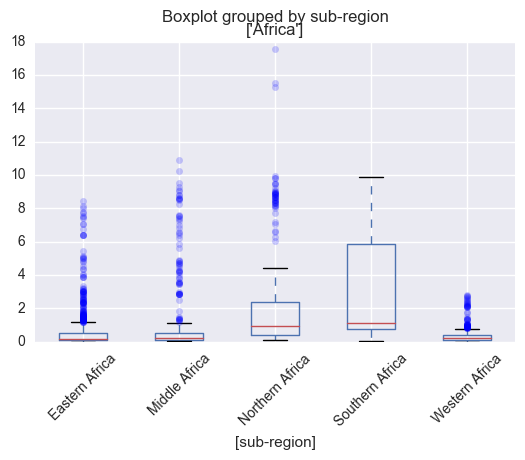

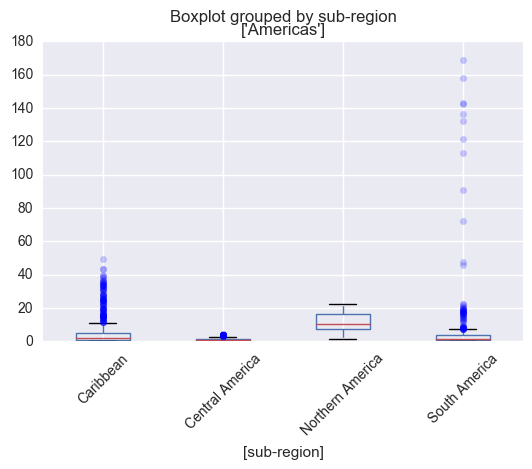

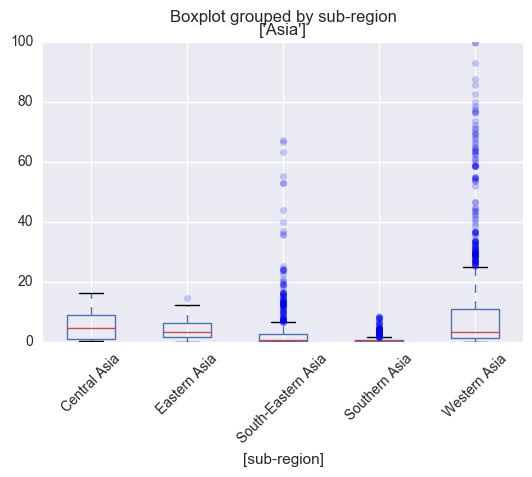

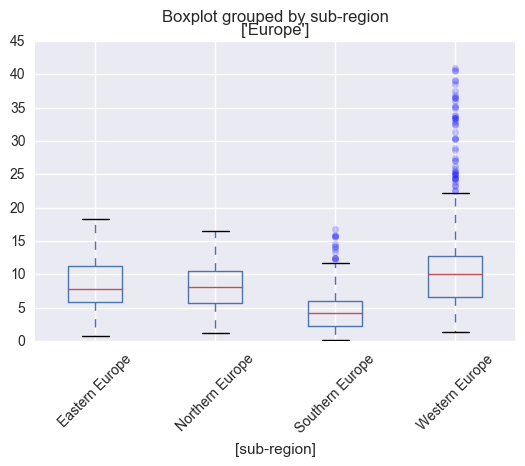

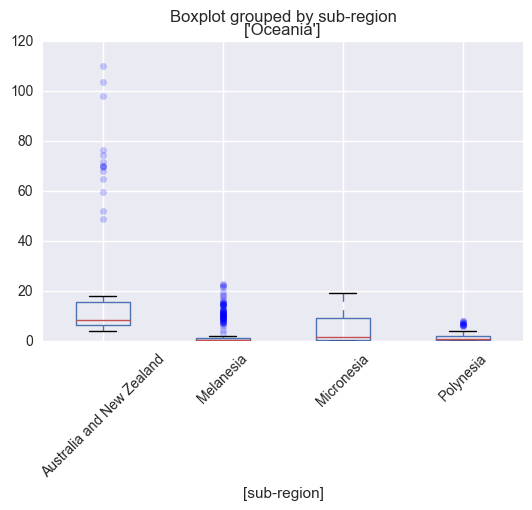

0    None
1    None
2    None
3    None
4    None
Name: df, dtype: object

In [1893]:
# boxplots by region & sub-region

# split reshaped into smaller regional co2_df's
regions_co2_dfs = facetize_df(co2_df_box, 'region')
showfliers=True

regions_co2_dfs['df'].apply(make_regional_boxplot, args=['sub-region', showfliers])

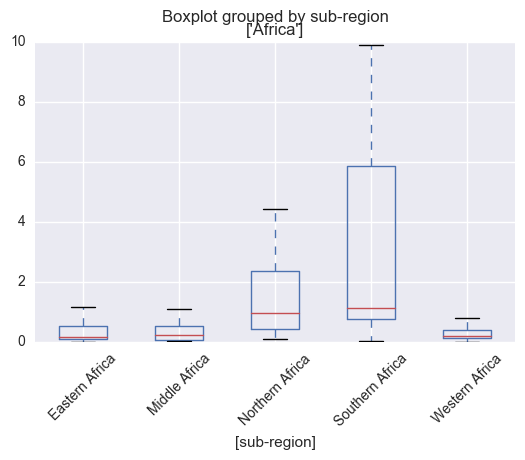

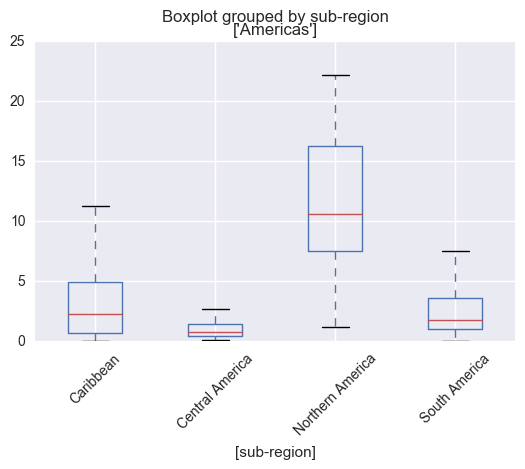

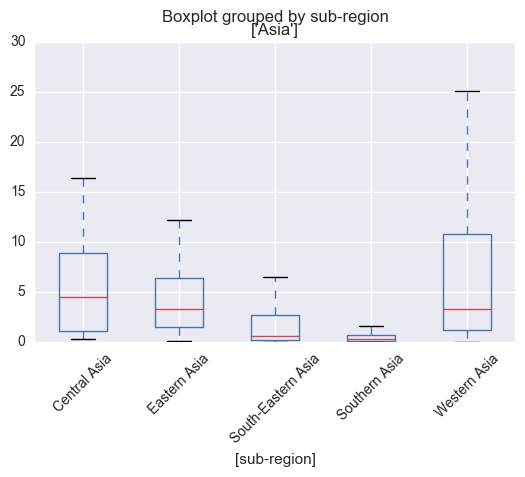

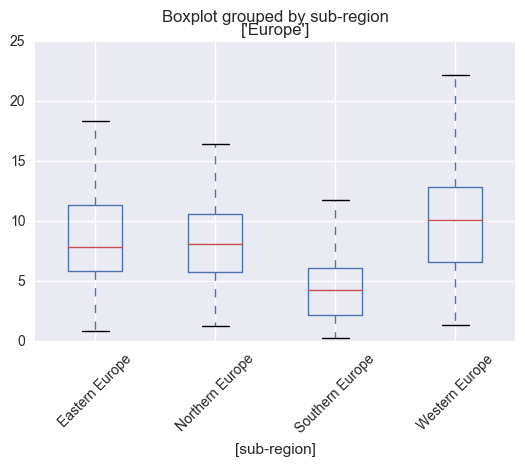

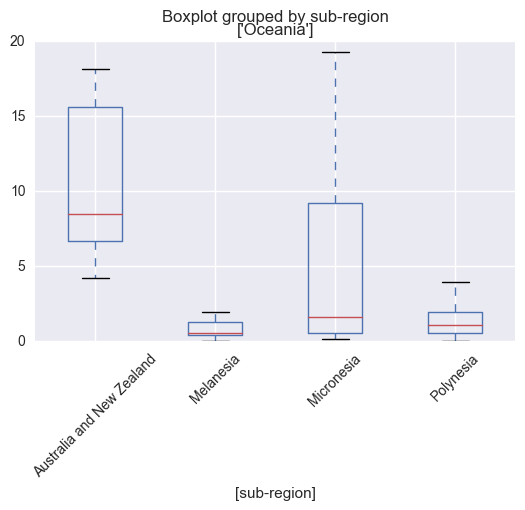

0    None
1    None
2    None
3    None
4    None
Name: df, dtype: object

In [1895]:
# same boxplots without outliers
showfliers = False
regions_co2_dfs['df'].apply(make_regional_boxplot, args=['sub-region', showfliers])

##### How much variance is there between regions?

While it's hard to tell which region has the _most_ variation between sub-regions, Europe seems to have the least. 

Americas and Oceania I suspect have the most, based on the differences in position & shape of the IQR boxes for their respective sub-regions.


In [1896]:
# which region is most homogenous, i.e.
# has lowest coefficient of variance?

(region_stats['std']/region_stats['mean']).sort_values().round(2)

region
Europe      0.66
Asia        2.00
Americas    2.02
Oceania     2.08
Africa      2.09
dtype: float64

### `CO2_pc`  over time

How have carbon emissions changed over time?
#### Plot means & medians

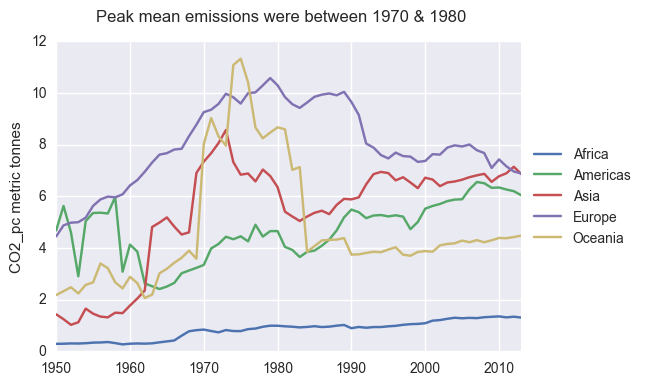

In [107]:
# mean CO2 by year & region
q = 'year >= 1950'
region_year = pd.DataFrame(co2_df.query(q).groupby(['year', 'region']).mean())[val]
region_year.unstack().plot();

plt.ylabel('%s metric tonnes' % val)
plt.xlabel('')
plt.suptitle("Peak mean emissions were between 1970 & 1980")
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

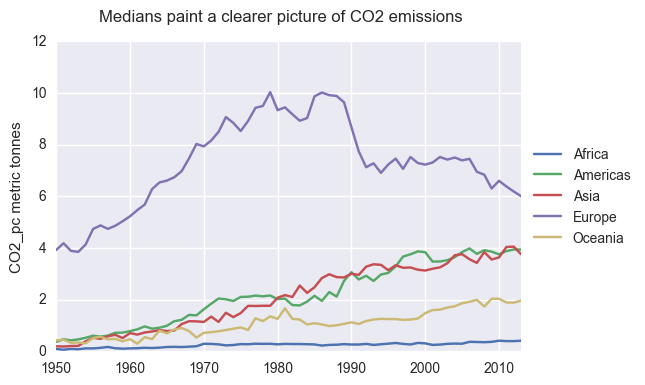

In [108]:
# median CO2 by year & region
region_year = pd.DataFrame(co2_df.query(q).groupby(['year', 'region']).median())[val]
region_year.unstack().plot()

plt.ylabel('%s metric tonnes' % val)
plt.xlabel('')
plt.suptitle("Medians paint a clearer picture of CO2 emissions", fontsize='medium', linespacing=10)
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

##### Observations

Europe remains the CO2 emissions gorilla. 

After steady growth between 1950 to 1980, European emissions wobbled in the 80s, then fell off a cliff around 1990. Emissions plateaued (now at late 60's levels) until around 2005, whereupon they steadily decreased.

By contrast, Asia, the Americas, and to a lesser extent Oceania have seen median CO2 emissions creep steadily upwards for the entire timeframe. You can almost imagine Asia & Amercia's curves converging with Europe's in a decade or so.

At the bottom of the medians plot, African emissions initially appear to be virtually flat, but they are increasing too. But Africa's baseline is so much lower in the first place that its CO2 growth is dwarfed by that of other regions.

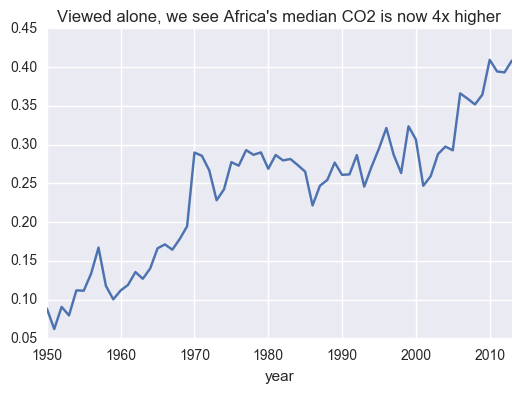

In [109]:
# show median Africa on its own
region_year.unstack()['Africa'].plot()
plt.title("Viewed alone, we see Africa's median CO2 is now 4x higher");


#### % change since 1950

Here we'll quantify the percentage change in median CO2 emssions for time period `q`.

In [1898]:
# create df of start & end year medians
start = region_year.unstack().index.min()
end = region_year.unstack().index.max()
region_year.unstack().loc[[start, end]]

# show % change of median value since beginning of time frame
change = region_year.unstack().loc[[start, end], ].pct_change()
change.sort_values(2013, axis=1)\
    .multiply(100).round()\
    .dropna(how='all')


region,Europe,Africa,Oceania,Americas,Asia
year,,,,,
2013,53.0,361.0,369.0,980.0,1833.0


Wow. Usually plots are more eye-opening than numbers, but in this case it's the reverse.

#### Zoom in on Europe

Why focus on Europe? 

* As home of the modern era's original superpowers, it has contributed the most to cumulative CO2 emissions. 
* For the 1950-2013 timeframe, Europe has the most homoegenous emission rates across sub-regions (measured by the coefficient of variation in mean `CO2_pc`)
* Unlike the other continents, median emissions have decreased dramatically since the mid-80s.
* Last but not least, it's been my home for the past 10 years (I'm Canadian but live in France).

##### Overview Plots

In [1906]:
# create europe CO2 df
q = "region=='Europe' & year >= 1950"
co2_eur_df = co2_df.query(q).loc[co2_df['region']=='Europe'].copy().reset_index(drop=True)

# assign name attribute for use in plot titles
co2_eur_df.name = 'Europe CO2'


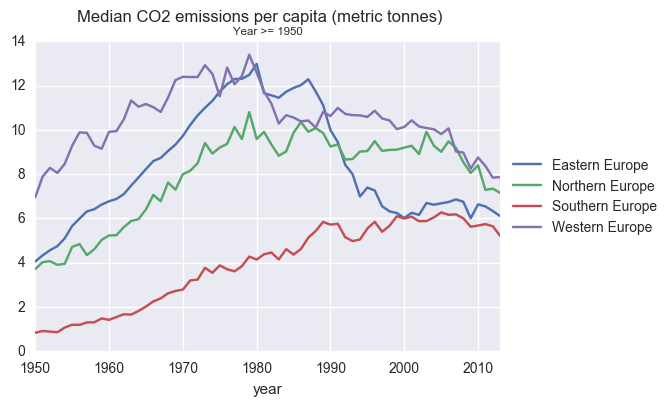

In [1337]:
# create df of sub-region medians
q = "year >= 1950"
val = 'CO2_pc'
eur_medians = co2_eur_df.query(q).groupby(['year','region', 'sub-region'])[val].median().unstack()
eur_medians.reset_index('region').plot()

# plot
plt.suptitle('Median CO2 emissions per capita (metric tonnes)')
plt.title(str.title(q), fontsize='x-small')
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

##### Mind the (decreasing) gap

Convergence! Since 1950, median `CO2_pc` in Western Europe has fallen enough while Southern Europe's has increased so that the gap has been cut in more than half.

In [1338]:
# diff by sub-region for start & end medians
start = co2_eur_df['year'].min()
end = co2_eur_df['year'].max()

start_end = eur_medians.loc[[start, end]]
start_end

,sub-region,Eastern Europe,Northern Europe,Southern Europe,Western Europe
year,region,,,,
1950,Europe,4.05544,3.71689,0.838790,6.95334
2013,Europe,6.10787,7.15232,5.211765,7.87299


In [114]:
# % change by sub-region
start_end.pct_change().multiply(100).round(2).drop(start)

,sub-region,Eastern Europe,Northern Europe,Southern Europe,Western Europe
year,region,,,,
2013,Europe,50.61,92.43,521.34,13.23


In [115]:
# change in the gap between top & bottom sub-regions
start_end.max(axis=1).subtract(start_end.min(axis=1))

year  region
1950  Europe    6.114550
2013  Europe    2.661225
dtype: float64

## Sub-region plots

I'd like to drill-down on each sub-region to see whether there is duplicate data. For this, I'll need interactive plots. Plot.ly is excellent for this sort of thing.

In [116]:
## helper functions
# refactored
def plotly_line2(df, val):
    name = df.name
    df = df.pivot('year', 'country', val)
    fig = df.iplot(asFigure = True,\
                    title = " ".join([val,name]),\
                    yTitle = str.title('%s in metric tonnes' % val),\
                    theme = 'ggplot')
    
    return fig

def plotly_timeseries(df, value):
    fig = plotly_line2(df, value)
    py.offline.iplot(fig)
    
    
def plot_facet_timeseries(df, facet, val):
    #df_list = facetize_df(df, facet)
    #pd.Series(df_list).apply(plotly_timeseries, args=[val])
    for f in df[facet].unique():
        facet_df = df.loc[df[facet]==f]
        facet_df.name = f
        plotly_timeseries(facet_df, val)

In [1768]:
# create spaghetti plots for each sub-region
plot_facet_timeseries(co2_eur_df, 'sub-region', 'CO2_pc')


### Duplicate data

The collapse of the Soviet Union also has resulted in duplicate data. See for yourself.

 * To view only one country, **double-click** that country in the legend. To add other countries **single-click**.
 * To reset, **double-click any other value**.

Western Europe: 
* E. Germany, W. Germany, and Germany overlap
   
Eastern Europe:
* Russia & Ussr - overlapping data
* Czecheslovakia, Czech Rep. & Slovak Rep - overlap again. The line for Czech Rep. is actually _above_ that for Czecheslovakia, which doesn't make sense unless the latter is in reality an average of Slovak & Czech Republic.  
    
    
Southern Europe:
* Serbia; Serbia And Montenegro; Montenegro - overlap

### Clean & de-dupe

Can you see a difference?

In [1800]:
# Does this change the distributions?

drop_dupes = ['East Germany', 'West Germany', 'Ussr', 'Czechoslovakia', 'Serbia And Montenegro']
drop_index = co2_eur_df.loc[co2_eur_df['country'].isin(drop_dupes)].index
len(drop_index)

180

In [1341]:
# before, with overlapping countries
co2_eur_orig = co2_eur_df.query(q).groupby('sub-region').describe()[val]

# after dropping the redundant countriex
co2_eur_dedupe = co2_eur_df.drop(drop_index).query(q).groupby('sub-region').describe()[val]

# what's the difference?
co2_eur_dedupe - co2_eur_orig

,count,mean,std,min,25%,50%,75%,max
sub-region,,,,,,,,
Eastern Europe,-84.0,-0.433609,-0.123709,0.0,-0.18306,-0.35272,-0.915957,0.0
Northern Europe,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.000000,0.0
Southern Europe,-14.0,0.002366,0.028553,0.0,-0.03873,-0.02286,0.028130,0.0
Western Europe,-82.0,-0.411092,0.414775,0.0,-0.31471,-0.67570,-0.938580,0.0


In [1817]:
co2_eur_df.head()

,country,region,sub-region,year,CO2_pc
0,Albania,Europe,Southern Europe,1950,0.23512
1,Albania,Europe,Southern Europe,1951,0.31327
2,Albania,Europe,Southern Europe,1952,0.28418
3,Albania,Europe,Southern Europe,1953,0.30735
4,Albania,Europe,Southern Europe,1954,0.36325


In [1816]:
# look at timeseries once more with de-duped data
q = "year >= 1950 & region == 'Europe'"

# create spaghetti plots for each sub-region
for reg in co2_eur_df.query(q)['region'].unique():
    reg_df = co2_df.query(q).loc[co2_df['region']==reg]
    plot_facet_timeseries(reg_df, 'sub-region', 'CO2_pc')

### What prompted the CO2 declines of recent years?

Two things come to mind: 
* after 3 years of negotiating targets, 2008 marked the start of Phase 1 implementation for the Kyoto Protocol (Phase 1 ended in 2012)
* in the 2nd half of 2008 the global financial crash (Great Recession) began.

# Multi-variate analysis

## About the additional data

All data was downloaded from the Gapminder website.

`energy-use_pc` (kWh): Energy use refers to use of primary energy before transformation to other end-use fuels, which is equal to indigenous production plus imports and stock changes, minus exports and fuels supplied to ships and aircraft engaged in international transport. From [Electricity use, per person](https://docs.google.com/spreadsheets/d/1nm__JKA7p85YTEV-LCtREdR8QNc-oi0TgjJFFTNupgU/pub?range=A1:D70&gid=1&output=html#).

`energy-production_pc` (tonnes of oil equivalent) From [Energy production, per person (toe)](https://docs.google.com/spreadsheets/d/1Kze_MKuTFaw3_BO_fgte2kQaGV54rq873o_KzyM7Kyk/pub?range=A1:D70&gid=1&output=html#). 

`gini_idx`: A measure from 0 to 100, where 0 represents perfect equality. On Gapminder: [GINI Index](https://docs.google.com/spreadsheets/d/1Iztdl7Ddaz77K3HheGpkvQ1o_ui_L1s-sze_ZpTM0F0/pub?range=A1:D70&gid=1&output=html#).

`military_%gdp` From [Military expenditure (% of GDP)](https://docs.google.com/spreadsheets/d/1HXH3ncdQLFpOXVNdC2nkPCSGz_perkfPcBeU1e2HF24/pub?range=A1:D70&gid=1&output=html#)

`gas_price_liter` From [Pump price for gasoline (US$ per liter)](https://docs.google.com/spreadsheets/d/1s54748oSGemV3pFVKBpyTKkhucu2ojLQ6AmexHNtdO4/pub?range=A1:D70&gid=1&output=html#)

`hdi`: A composite index measuring average ability to lead a long and healthy life,
measured by life expectancy at birth; the ability to acquire
knowledge, measured by mean years of schooling
and expected years of schooling; and the ability to
achieve a decent standard of living, measured by gross
national income per capita. See Technical note 1 at http://hdr.undp.org/. From [HDI (Human Development Index)](https://docs.google.com/spreadsheets/d/178j02780CUiRqZOmc6Eybg9YwEH4LRddQ68afSZo4ak/pub?range=A1:D70&gid=1&output=html#)

`income_pc`: GDP per capita measures the value of everything produced in a country during a year, divided by the number of people. The unit is in international dollars, fixed 2011 prices. The data is adjusted for inflation and differences in the cost of living between countries, so-called PPP dollars. From [Income per person (GDP/per capita, PPPdollars inflation-adjusted)](https://github.com/Gapminder-Indicators/gdppc_cppp/raw/master/gdppc_cppp-by-gapminder.xlsx)

`population`: We use UN population data between 1950 to 2100 from UN Population Division World Population Prospects 2017 and the forecast to year 2100 is using their medium fertility variant. For years before 1950, this version uses the data documented in greater detail by Mattias Lindgren in version 3 below. The main source there was Angus Maddison’s data which is maintained and improved by CLIO Infra Project. From [Population, total](https://www.gapminder.org/data/documentation/gd003/).



## Explore the data

In [1566]:
# expand DF to include all columns
df = pd.read_csv(mypath + 'final_df.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 13 columns):
country                 17055 non-null object
region                  17055 non-null object
sub-region              17055 non-null object
year                    17055 non-null int64
CO2_pc                  17055 non-null float64
energy_use_pc           5324 non-null float64
energy_production_pc    5978 non-null float64
hdi                     3898 non-null float64
income_pc               14969 non-null float64
gini_idx                5281 non-null float64
military_%gdp           8016 non-null float64
population              12517 non-null float64
gas_price_liter         3995 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.7+ MB


In [1567]:
# drop duplicate countries as per Zoom-in on Europe section
drop_index = df.loc[df['country'].isin(drop_dupes)].index
df = df.drop(drop_index)

# rename energy columns
df.rename(columns={'energy_use_pc':'energy-use_pc', 'energy_production_pc':'energy-prod_pc'}, inplace=True)

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16677 entries, 0 to 17054
Data columns (total 13 columns):
country            16677 non-null object
region             16677 non-null object
sub-region         16677 non-null object
year               16677 non-null int64
CO2_pc             16677 non-null float64
energy-use_pc      5324 non-null float64
energy-prod_pc     5978 non-null float64
hdi                3898 non-null float64
income_pc          14969 non-null float64
gini_idx           5281 non-null float64
military_%gdp      8016 non-null float64
population         12337 non-null float64
gas_price_liter    3995 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.8+ MB


There's a lot of null values in these new columns

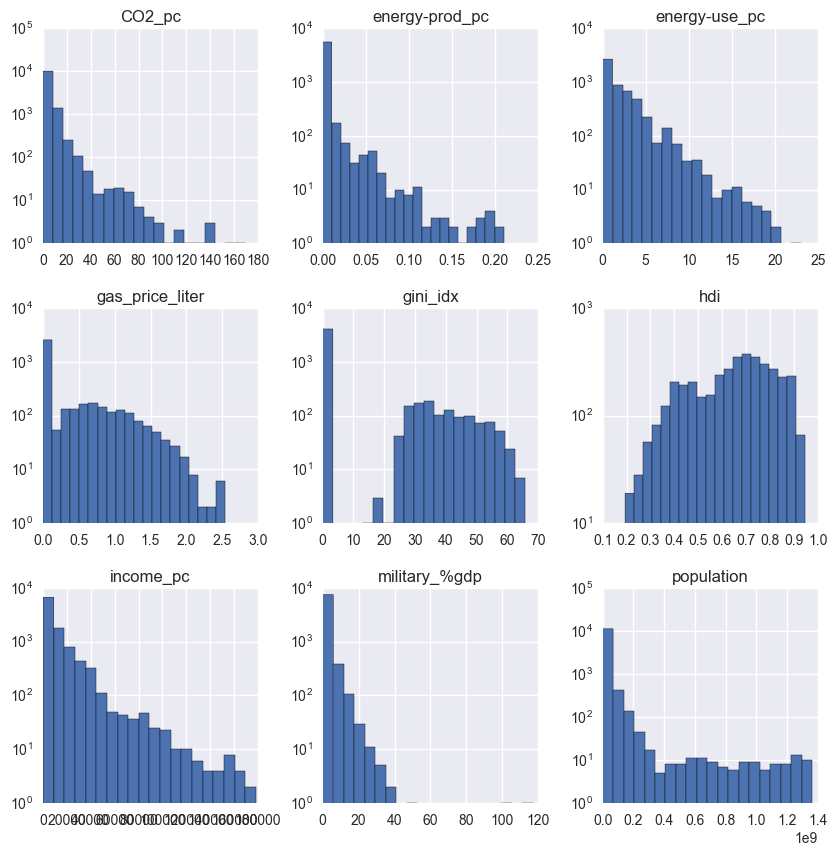

In [1568]:
# plot with log y-axis
q = "year >= 1950"
df.query(q).drop(['year'], axis=1)\
    .hist(figsize=(10,10), log=True, bins=20); 

In [1569]:
# stats
df.query(q).describe().round(2)

,year,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
count,11927.00,11927.00,5324.00,5978.00,3898.00,10443.00,5281.00,8016.00,1.191000e+04,3995.00
mean,1983.69,4.46,2.21,0.00,0.64,11380.27,9.07,2.18,2.456421e+07,0.32
std,18.23,8.41,2.57,0.02,0.17,16703.63,17.28,3.42,9.878111e+07,0.51
min,1950.00,0.00,0.01,0.00,0.19,247.00,0.00,0.00,1.072000e+03,0.00
25%,1968.00,0.35,0.52,0.00,0.51,2030.00,0.00,0.00,4.839058e+05,0.00
50%,1985.00,1.55,1.17,0.00,0.67,5250.00,0.00,1.47,4.515785e+06,0.00
75%,2000.00,5.92,3.03,0.00,0.77,13700.00,0.00,2.74,1.446561e+07,0.61
max,2013.00,169.13,23.07,0.21,0.94,178000.00,65.80,117.00,1.362514e+09,2.54


There also seems to be a lot of zeros.

In [1624]:
# Which columns contain 0 values?
fltr = df.set_index(['country', 'year'])!=0.

df.set_index(['country', 'year']).mask(fltr).count()

region                0
sub-region            0
CO2_pc               62
energy-use_pc         0
energy-prod_pc     1069
hdi                   0
income_pc             0
gini_idx           4070
military_%gdp      2015
population            0
gas_price_liter    2519
dtype: int64

In [1635]:
# for how many countries or years?
df.set_index(['country', 'year']).mask(fltr).dropna(how='all', axis=1).index

MultiIndex(levels=[[u'Afghanistan', u'Albania', u'Algeria', u'Andorra', u'Angola', u'Anguilla', u'Antigua And Barbuda', u'Argentina', u'Armenia', u'Aruba', u'Australia', u'Austria', u'Azerbaijan', u'Bahamas', u'Bahrain', u'Bangladesh', u'Barbados', u'Belarus', u'Belgium', u'Belize', u'Benin', u'Bermuda', u'Bhutan', u'Bolivia', u'Bosnia And Herzegovina', u'Botswana', u'Brazil', u'British Virgin Islands', u'Brunei', u'Bulgaria', u'Burkina Faso', u'Burundi', u'Cambodia', u'Cameroon', u'Canada', u'Cape Verde', u'Cayman Islands', u'Central African Republic', u'Chad', u'Chile', u'China', u'Christmas Island', u'Colombia', u'Comoros', u'Congo Dem Rep', u'Congo Rep', u'Cook Is', u'Costa Rica', u'Cote D Ivoire', u'Croatia', u'Cuba', u'Cura Ao', u'Cyprus', u'Czech Republic', u'Denmark', u'Djibouti', u'Dominica', u'Dominican Republic', u'Ecuador', u'Egypt', u'El Salvador', u'Equatorial Guinea', u'Eritrea', u'Estonia', u'Ethiopia', u'Faeroe Islands', u'Falkland Is Malvinas', u'Fiji', u'Finland', u'

### Replace the zeros

There seems to be a lot of zero values here that should actually be NaNs. For example, I truly doubt the price of gas anywhere, at anytime, was 0. Nor can I believe that war-torn Afghanistan spent 0% of GDP on the military during the 60s,70s, and 80s! 

Similarly, the gini inequality index has a scale of 0-100, where 0 = perfect equality. While feasible, it seems extremely unlikely that so many countries achieved such a Utopian state?

In [1606]:
q = "gini_idx==0."
df.query(q).groupby('country').mean()['gini_idx'].head(20)

country
Albania                   0.0
Algeria                   0.0
Angola                    0.0
Argentina                 0.0
Armenia                   0.0
Australia                 0.0
Austria                   0.0
Azerbaijan                0.0
Bangladesh                0.0
Belarus                   0.0
Belgium                   0.0
Belize                    0.0
Benin                     0.0
Bhutan                    0.0
Bolivia                   0.0
Bosnia And Herzegovina    0.0
Botswana                  0.0
Brazil                    0.0
Bulgaria                  0.0
Burkina Faso              0.0
Name: gini_idx, dtype: float64

So here I'm going to assume these 0s should be NaN.

In [1642]:
# replace 0.0 vals with NaNs
df.replace(0., np.nan, inplace = True)

,year,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
count,11927.0,11921.0,5324.0,4909.0,3898.0,10443.0,1211.0,6001.0,1.191000e+04,1476.0
mean,1983.7,4.5,2.2,0.0,0.6,11380.3,39.6,2.9,2.456421e+07,0.9
std,18.2,8.4,2.6,0.0,0.2,16703.6,9.8,3.7,9.878111e+07,0.5
min,1950.0,0.0,0.0,0.0,0.2,247.0,16.2,0.0,1.072000e+03,0.0
25%,1968.0,0.3,0.5,0.0,0.5,2030.0,31.7,1.3,4.839058e+05,0.5
50%,1985.0,1.5,1.2,0.0,0.7,5250.0,37.5,2.0,4.515785e+06,0.8
75%,2000.0,5.9,3.0,0.0,0.8,13700.0,47.0,3.3,1.446561e+07,1.2
max,2013.0,169.1,23.1,0.2,0.9,178000.0,65.8,117.0,1.362514e+09,2.5


In [1643]:
# verify
df.set_index(['country', 'year']).mask(fltr).count()

region             0
sub-region         0
CO2_pc             0
energy-use_pc      0
energy-prod_pc     0
hdi                0
income_pc          0
gini_idx           0
military_%gdp      0
population         0
gas_price_liter    0
dtype: int64

In [1645]:
# we should see even fewer non-null values now
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16677 entries, 0 to 17054
Data columns (total 13 columns):
country            16677 non-null object
region             16677 non-null object
sub-region         16677 non-null object
year               16677 non-null int64
CO2_pc             16615 non-null float64
energy-use_pc      5324 non-null float64
energy-prod_pc     4909 non-null float64
hdi                3898 non-null float64
income_pc          14969 non-null float64
gini_idx           1211 non-null float64
military_%gdp      6001 non-null float64
population         12337 non-null float64
gas_price_liter    1476 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 2.4+ MB


### Fill the nulls

Now it's time to fill some NaNs. The method will depend on the variable.

Variables like population, military_%gpd, gini_idx, a



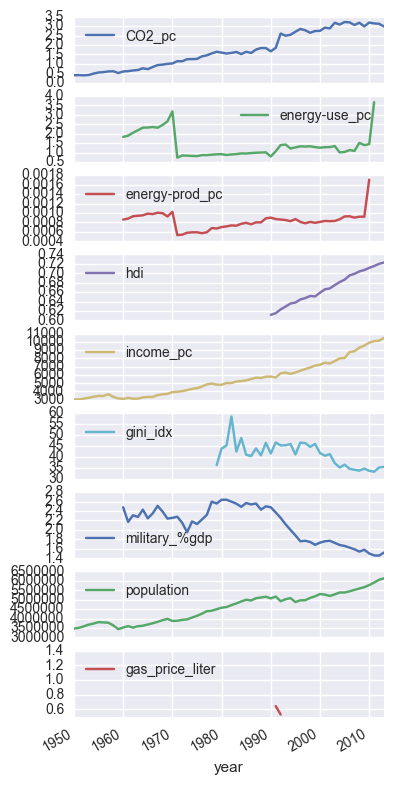

In [1707]:
# are there clear trends for the data?
index = ['region', 'sub-region', 'country', '']
q = "year >=1950"
df.query(q).groupby('year').median().plot(subplots=True, figsize = (4,10));

Generally, yes, especially after 1990. The recent spikes for the energy columns make me uneasy, though.

And what's with plot for gas price?

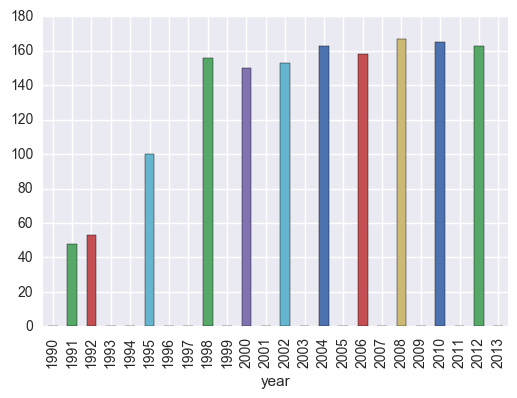

In [1704]:
# how many values are there for gas price?
df.query(q).groupby('year')['gas_price_liter'].count().plot(kind='bar');

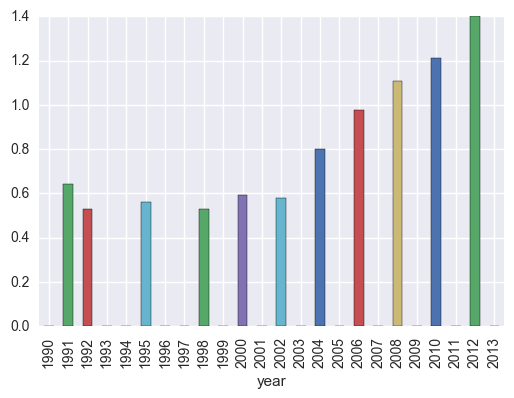

In [1706]:
# and are there some really low values that were hidden from the earlier plot?

df.query(q).groupby('year')['gas_price_liter'].median().plot(kind='bar');

My analysis will focus on the period 1990 onwards, as 1990 is generally considered the 'base year' when discussing rising CO2 levels.

This also will work better for imputating missing values, as trends are clearer from 1990, in particular for `military_%gdp`, the `energy` colums, and `gini_idx`.

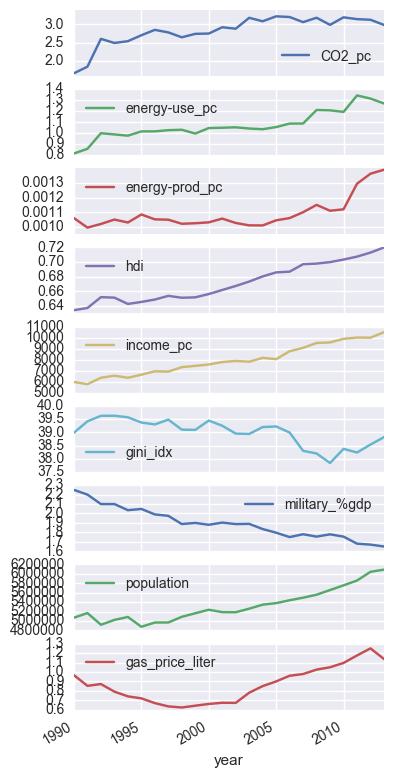

In [1710]:
q = "year >= 1990"
df_imputed = df.query(q).interpolate(method='linear',
                                     limit_area='inside') # only impute between valid values

df_imputed.groupby('year').median().plot(subplots=True, figsize = (4,10));

In [1709]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5054 entries, 41 to 17054
Data columns (total 13 columns):
country            5054 non-null object
region             5054 non-null object
sub-region         5054 non-null object
year               5054 non-null int64
CO2_pc             5054 non-null float64
energy-use_pc      5030 non-null float64
energy-prod_pc     5030 non-null float64
hdi                5054 non-null float64
income_pc          5054 non-null float64
gini_idx           5024 non-null float64
military_%gdp      5040 non-null float64
population         5054 non-null float64
gas_price_liter    5042 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 552.8+ KB


In [1708]:
# now let's run the stats again
df_imputed.drop('year', axis=1).describe()

,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
count,5054.000000,5030.000000,5030.000000,5054.000000,5054.000000,5024.000000,5040.000000,5.054000e+03,5042.000000
mean,5.013836,1.993489,0.004363,0.644954,14669.085279,39.591083,2.638543,2.953082e+07,0.898493
std,6.704416,2.377520,0.010434,0.160755,18048.116353,8.254427,3.764793,1.190247e+08,0.440550
min,0.000580,0.009021,0.000010,0.194000,247.000000,16.200000,0.000020,1.610000e+03,0.020000
25%,0.646950,0.516667,0.000390,0.529000,2780.000000,33.283750,1.260000,6.133150e+05,0.567514
50%,2.835065,1.067660,0.001091,0.669000,7920.000000,39.040192,1.897972,5.299102e+06,0.850000
75%,7.195658,2.647948,0.003208,0.767734,19300.000000,44.643713,2.900000,1.853434e+07,1.180000
max,70.978310,23.071099,0.123000,0.945000,129000.000000,65.800000,117.000000,1.362514e+09,2.540000


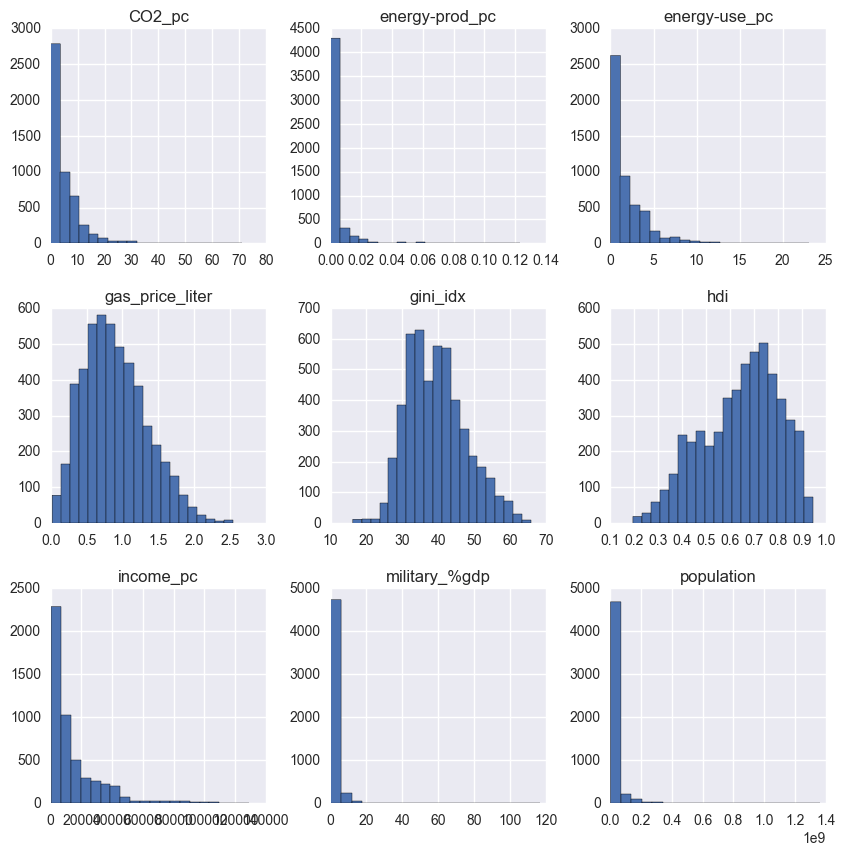

In [1715]:
# look at histograms again
df_imputed.drop(['year'], axis=1)\
    .hist(figsize=(10,10), bins=20); 

In [1713]:
# do we see a difference in the correlations?
val = 'CO2_pc'
corr_df_imp = df_imputed.drop(['year'], axis=1).corr().round(2)
corr_df_imp[val]

CO2_pc             1.00
energy-use_pc      0.77
energy-prod_pc     0.57
hdi                0.51
income_pc          0.71
gini_idx          -0.29
military_%gdp      0.06
population        -0.03
gas_price_liter   -0.03
Name: CO2_pc, dtype: float64

### Transform negative-skew data

All the columns except `gini_idx`, `gas_price_liter` and `hdi` are strongly negatively skewed.

Let's apply a log transform to these skewed columns.

In [1726]:
transform_cols = [u'CO2_pc', u'energy-use_pc', u'energy-prod_pc', u'income_pc',
       u'military_%gdp', u'population', ]

log_df_imputed = df_imputed.copy()

log_df_imputed[transform_cols] = log_df_imputed[transform_cols].apply(np.log)

In [1727]:
# rename columns
new_names = [(i,'log_'+i) for i in log_df_imputed[transform_cols].columns.values]
log_df_imputed.rename(columns = dict(new_names), inplace=True)
log_df_imputed.head()

,country,region,sub-region,year,log_CO2_pc,log_energy-use_pc,log_energy-prod_pc,hdi,log_income_pc,gini_idx,log_military_%gdp,log_population,gas_price_liter
41,Afghanistan,Asia,Southern Asia,1990,-1.529518,NaN,NaN,0.295,6.946976,NaN,NaN,16.306032,NaN
42,Afghanistan,Asia,Southern Asia,1991,-1.657316,NaN,NaN,0.300,6.937314,NaN,NaN,16.364125,NaN
43,Afghanistan,Asia,Southern Asia,1992,-2.288978,NaN,NaN,0.309,6.856462,NaN,NaN,16.436232,NaN
44,Afghanistan,Asia,Southern Asia,1993,-2.399426,NaN,NaN,0.305,6.706862,NaN,NaN,16.511783,NaN
45,Afghanistan,Asia,Southern Asia,1994,-2.506416,NaN,NaN,0.300,6.595781,NaN,NaN,16.579939,NaN


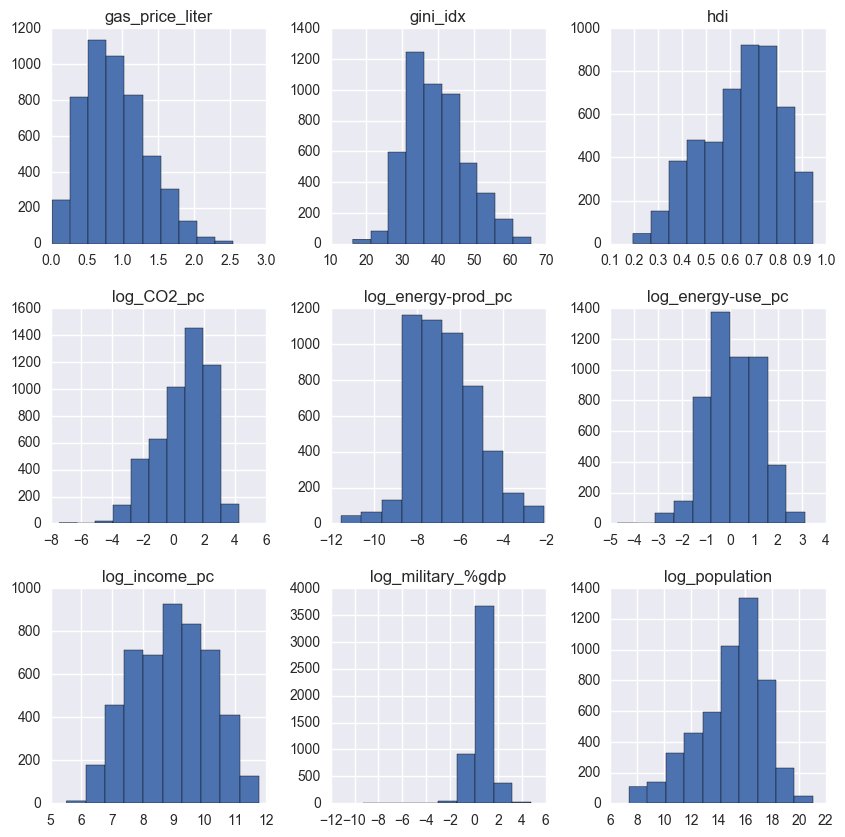

In [1718]:
# let's revisit the histograms once more
log_df_imputed.drop(['year'], axis=1)\
    .hist(figsize=(10,10), bins=10); 

The columns look at least _closer_ to normal.

In [1723]:
# have the correlations changed?
val = 'log_CO2_pc'
log_df_imputed.drop('year', axis=1).corr().round(2)[val].sort_values()

gini_idx             -0.32
log_population       -0.20
gas_price_liter       0.05
log_military_%gdp     0.15
log_energy-prod_pc    0.27
log_energy-use_pc     0.62
hdi                   0.79
log_income_pc         0.84
log_CO2_pc            1.00
Name: log_CO2_pc, dtype: float64

Yes, indeed they've changed: `hdi` has grown stronger, while the `log_energy-` variables now have weaker correlations.

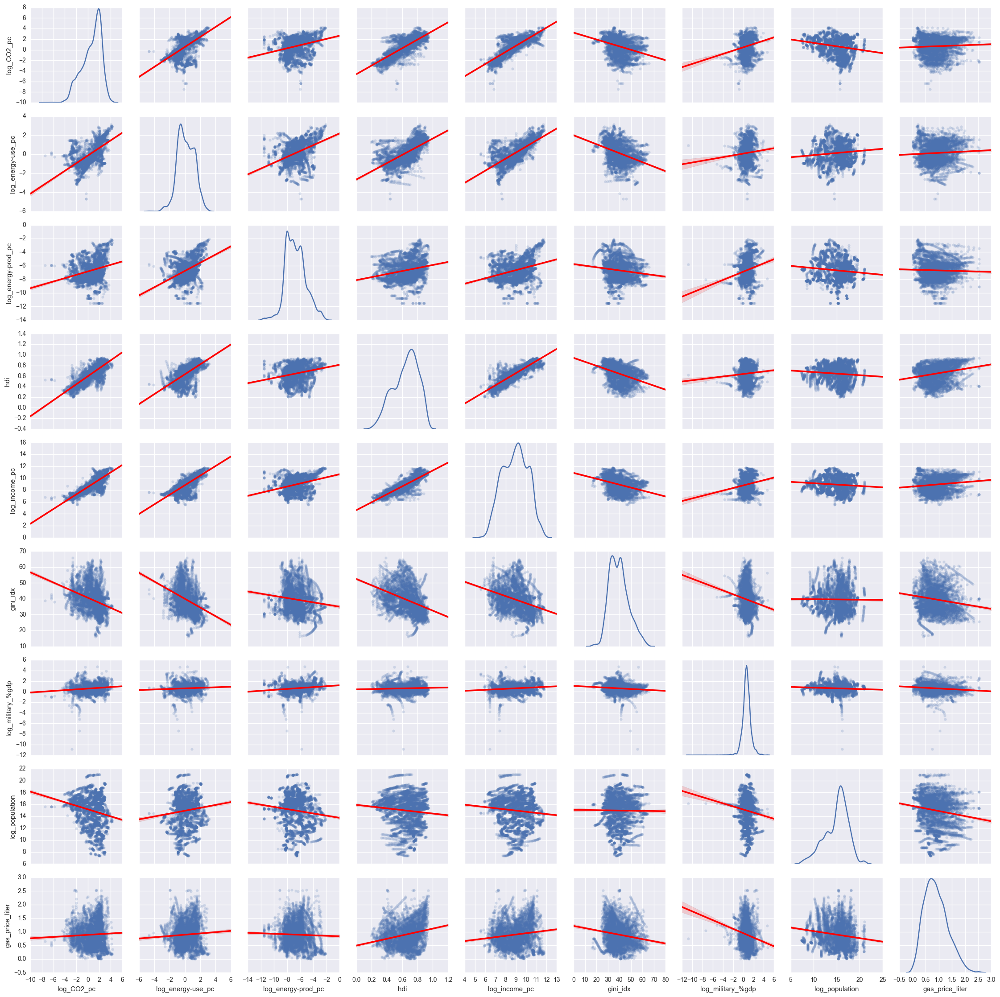

In [1725]:
# seaborn pairplot
plot_kws={'line_kws':{'color':'red'}, 'scatter_kws': {'alpha': 0.2}}

sns.pairplot(log_df_imputed.query(q).drop(['year'], axis=1), 
             kind='reg', diag_kind='kde', plot_kws = plot_kws);

Aside from the energy, income, and HDI columns (which is also strongly correlated with energy use and income), there's no surprising correlations with `CO2_pc` here.

Maybe if we look by region....

## Regions distributions of transformed columns

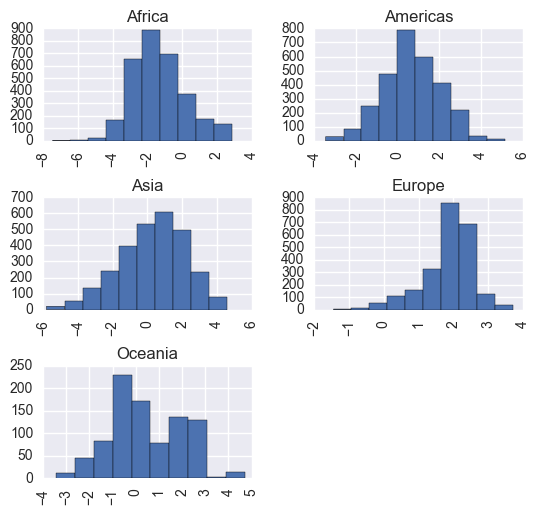

In [163]:
q = "year >= 1950"
val = 'log_CO2_pc'
log_df.query(q)[val].hist(by = df['region'], figsize=(6,6));

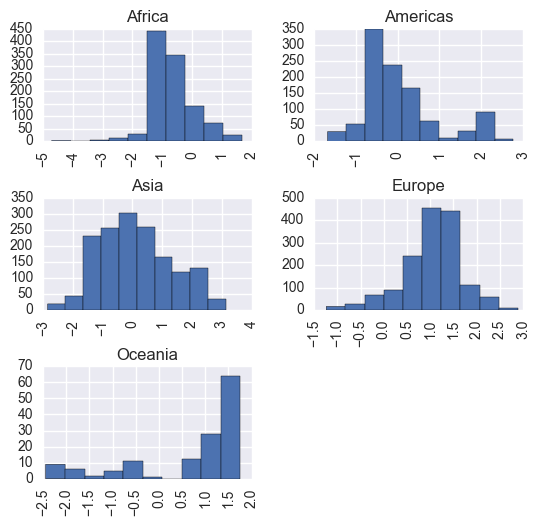

In [161]:
val = 'log_energy_use_pc'
log_df.query(q)[val].hist(by = df['region'], figsize=(6,6));

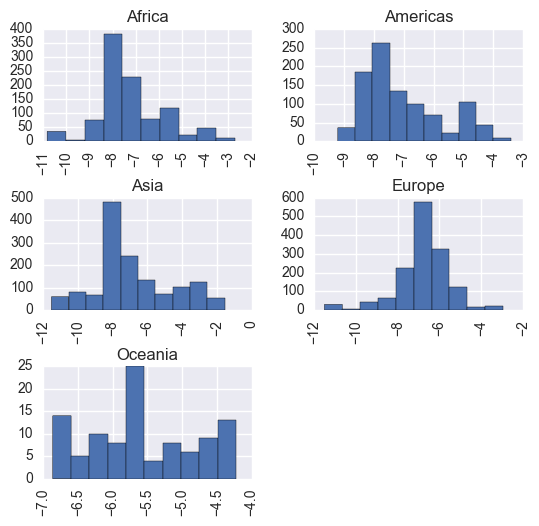

In [165]:
val = 'log_energy_production_pc'
log_df.query(q)[val].hist(by = df['region'], figsize=(6,6));

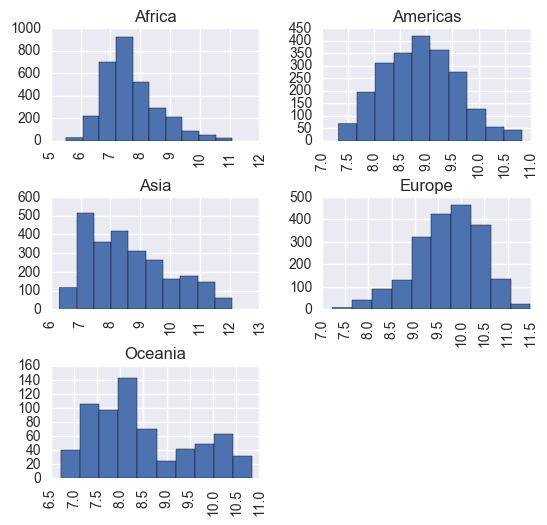

In [166]:
val = 'log_income_pc'
log_df.query(q)[val].hist(by = df['region'], figsize=(6,6));

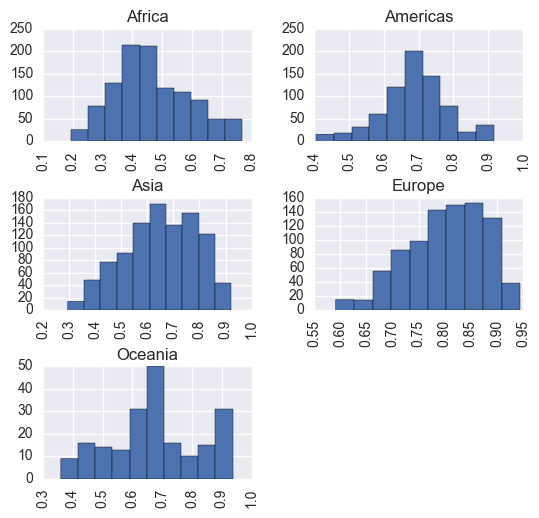

In [167]:
val = 'hdi'
df.query(q)[val].hist(by = df['region'], figsize=(6,6));

Oceania's distributions for these high-correlating columns are bi- (if not multi-) modal. The Americas and Asia also have a few non-normal histograms. 

Interestingly Africa and Europe, the regions at the top & the bottom of the CO2 emissions scale, have the most consistently normal histograms.

In [169]:
# correlations by region, hiding weak ones
val = 'log_CO2_pc'
corr_reg_df = log_df.query(q).drop(['year'], axis=1).groupby('region').corr()
mask_lower = abs(corr_reg_df) < .5 
corr_reg_df.mask(mask_lower)[val].dropna()

region                            
Africa    hdi                         0.857341
          log_CO2_pc                  1.000000
          log_energy_production_pc    0.601309
          log_energy_use_pc           0.723976
          log_income_pc               0.843556
Americas  gini_idx                   -0.575580
          hdi                         0.828118
          log_CO2_pc                  1.000000
          log_energy_production_pc    0.755659
          log_energy_use_pc           0.939027
          log_income_pc               0.877506
Asia      hdi                         0.846306
          log_CO2_pc                  1.000000
          log_energy_production_pc    0.640347
          log_energy_use_pc           0.917518
          log_income_pc               0.847867
Europe    log_CO2_pc                  1.000000
          log_energy_use_pc           0.855501
          log_income_pc               0.665940
Oceania   gini_idx                   -0.718897
          hdi            

Breaking down by region, the only differences are in: 
* Europe, which seems to be the outlier region in general. It doesn't seem to behave as the others, which is unsurprising given the continent's historical advantage in trade and industrialization.
* Oceania. However, I don't entirely trust Oceania's correlations because:
    * the population of countries for Oceania is less than half that of the other regions
    * its distribution of `CO2_pc`, even with a log transformation, is not normal.
    * its distribution of wealth, in terms of income and HDI, I suspect is highly unequal. It seems to be essentially concentrated in the sub-region 'Australia & New Zealand'. 

## Scatter matrix

In [1332]:
val = 'log_CO2_pc'
corr_log_df = log_df.query(q).corr()
mask_lower = abs(corr_log_df) < .5
corr_log_df.mask(mask_lower)[val].dropna()

log_CO2_pc            1.000000
log_energy-use_pc     0.899799
log_energy-prod_pc    0.573851
hdi                   0.867079
log_income_pc         0.914447
Name: log_CO2_pc, dtype: float64

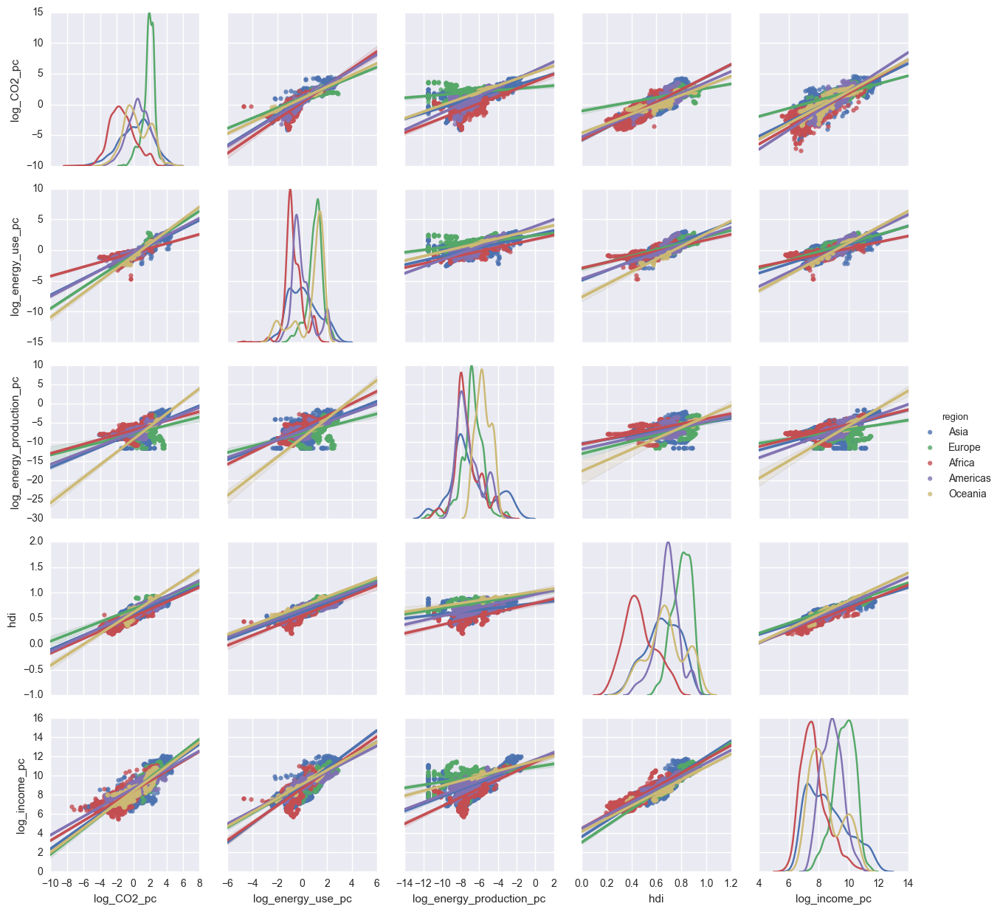

In [170]:
# pairplot by region
pp_plot_vars = ['region','log_CO2_pc', 'log_energy_use_pc', 'log_energy_production_pc', 'hdi', 'log_income_pc']
pp_df = log_df.query(q)[pp_plot_vars]
sns.pairplot(pp_df, hue='region', diag_kind='kde', kind='reg');

When you look at correlations by region, Oceania's look amazingly strong. However, looking Oceania's histograms and points in the pairplot matrix, the data, even when log transformed, is not normally distributed. 

On the pairplot Oceania's data points (already sparse compared to other regions) form clumps, with outliers that can exagerate the slope of the trendline.

In [ ]:
log_df.query(q).drop(['year'], axis=1)\
    .groupby(['region'])\
    .agg(['mean', 'std']).round(2)

# Carbon footprints

Almost all the variables we've been looking at are per capita. It's all too easy to get a false sense of improvement when you see the slowdown in the CO2_pc growth in recent years, at least among the industrial powerhouses. 

It's time to step back and look once more at the overall picture. 

So who has the biggest carbon footprint these days? China? The US? Let's see.

In [1549]:
# convert population to int
# to enable bubble plots later on

df['population'] = df['population'].fillna(method='bfill').astype(int)
df['CO2footprint'] =  df['CO2_pc'].multiply(df['population'])

## Evolution over time

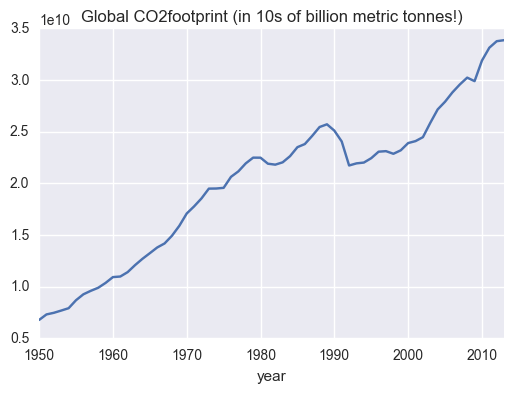

In [175]:
# What does the global trend line look like?
kind = 'Global'
val = 'CO2footprint'
unit = '(in 10s of billion metric tonnes!)'

annual_totals = df.groupby('year').sum()[val]
annual_totals.loc[1950:].plot()
plt.title(" ".join([kind, val, unit]));

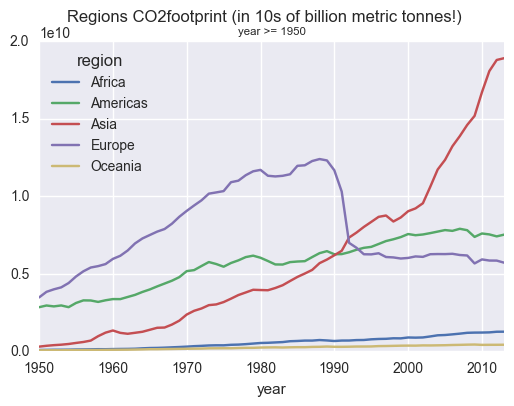

In [176]:
# regional timeseries
kind = 'Regions'
annual_totals = df.groupby(['region','year']).sum()[val]
annual_totals.unstack(level=0).loc[1950:].plot()
plt.suptitle(" ".join([kind, val, unit]))
plt.title(q, fontsize='x-small');

## Inflection point at 1990

1990 was an inflection point for both Asia and Europe's carbon footprints, where the former began to exceed the latter. Shortly afterwards, Asia's footprint began skyrocketing, while Europe's began a gradual downward trajectory.

## 1990 bubble plot

In [1317]:
# what did this look like a few decades earlier?
yr = 1990
q = "year==@yr"
val = 'CO2_pc'
size = 'CO2footprint'
x = 'population'
df.query(q).iplot(kind='bubble', x=x, y=val, size=size, text='country',\
           xTitle= x + " (log scale)", yTitle=val, categories='region', logx=True,\
             title='Who had the biggest %s in %s?' % (size, yr))

In [1318]:
# who had the biggest footprint back then?
df[['country','CO2_pc', 'population', 'CO2footprint']].loc[df.query(q)['CO2footprint'].idxmax()]

country         United States
CO2_pc                19.0752
population          252847810
CO2footprint      4.82312e+09
Name: 16152, dtype: object

## 2013 bubble plot

In [179]:
# show in bubble plot for most recent year
max_yr = df['year'].max()

yr = max_yr
q = "year==@max_yr"
val = 'CO2_pc'
size = 'CO2footprint'
x = 'population'
df.query(q).iplot(kind='bubble', x=x, y=val, size=size, text= 'country',\
           xTitle= x + " (log scale)", yTitle=val, categories='region', logx=True,\
             title='Who had the biggest %s in %s?' % (size, yr))

In [180]:
# who has biggest footprint now?
df[['country','CO2_pc', 'population', 'CO2footprint']].loc[df.query(q)['CO2footprint'].idxmax()]

country               China
CO2_pc              7.52178
population       1362514260
CO2footprint    1.02485e+10
Name: 3156, dtype: object

## Biggest increases & decreases

In [1279]:
# change from 1990 to 2013 by country
q = "year == 1990 | year == 2013"
val = 'CO2footprint'
footprint_df = df.query(q).set_index(['year', 'country']).drop(['region', 'sub-region'], axis=1)[val]
footprint_df = footprint_df.unstack()
footprint_df

country,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Antigua And Barbuda,Argentina,Armenia,Aruba,...,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Wallis Et Futuna,Yemen,Yugoslavia,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
1990,2.614318e+06,5.309325e+06,7.793506e+07,NaN,5.115037e+06,NaN,300666.91798,1.126034e+08,NaN,1.730666e+06,...,3.993006e+06,NaN,65999.5133,1.221512e+08,2.140622e+07,NaN,9.595672e+06,1.337910e+08,2.445630e+06,1.550268e+07
2013,2.126665e+07,4.814330e+06,1.342036e+08,419453.4275,3.246099e+07,120066.375,524333.59650,1.898012e+08,5.496328e+06,8.763332e+05,...,7.604678e+06,1.032168e+08,106334.3633,1.855150e+08,1.526107e+08,22011.6125,2.534402e+07,NaN,3.824328e+06,1.377939e+07


In [1281]:
# Helper functions

def topN_change(df, row, chg, n=5):
    '''Calculates difference between specified row & 
    previous row, returning highest N results'''

    if chg == 'diff':
        return df.diff().round(2).loc[row]\
        .dropna().sort_values(ascending=False).head(n)
        
    elif chg == 'pct':
        return df.pct_change().multiply(100).round(2).loc[row]\
        .dropna().sort_values(ascending=False)\
        .head(n)
        
    else:
        "Unrecognized function type for 'chg'. Specify 'diff' or 'pct'."
        
def bottomN_change(df, row, chg, n=5):
    '''Calculates difference between specified row & 
    previous row, returning lowest N results'''
    
    if chg == 'diff':
        return df.diff().round(2).loc[row]\
        .dropna().sort_values().head(n)
    elif chg == 'pct':
        return df.pct_change().multiply(100).round(2).loc[row]\
        .dropna().sort_values()\
        .head(n)
    else:
        "Unrecognized function type for 'chg'. Specify 'diff' or 'pct'."

In [1282]:
# which countries had the biggest % incr
top5 = topN_change(footprint_df, 2013, 'pct')
top5

country
Namibia              7207.84
Equatorial Guinea    4372.68
Somalia              3300.37
Nepal                 924.76
Lao                   922.52
Name: 2013, dtype: float64

### Sanity check!
These increases are insane.

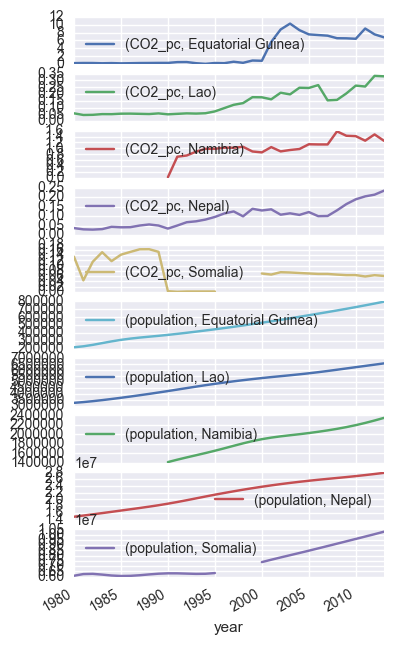

In [1266]:
# sanity check
q = "year >= 1980 & country in @top5.index"
df.query(q).set_index(['country', 'year'])[['CO2_pc','population']].unstack(level=0)\
    .plot(subplots=True, figsize=(4,8));

Ah hah. Namibia's data for both `population` and `CO2_pc` only starts in 1990. While the curve for the former looks reasonable, the latter's initial steep rise followed by a long plateau is suspect. It will be better to set this to NaN, so that Namibia is **not** included in the '1990-2013 % changes' data frame later on in this analysis.

Also, Equitorial Guinea and Somalia have very erratic `CO2_pc` curves. However, I saw the same fluctuating lines when I looked online:

* [Somalia](https://tradingeconomics.com/somalia/co2-emissions-metric-tons-per-capita-wb-data.html)
* [Equatorial Guinea](https://tradingeconomics.com/equatorial-guinea/co2-emissions-metric-tons-per-capita-wb-data.html)

In [1248]:
# any other countries with data only starting in 1990?
df.groupby('country')['year','CO2_pc'].min().query("year == 1990")

,year,CO2_pc
country,,
Marshall Islands,1990,1.00801
Namibia,1990,0.02850


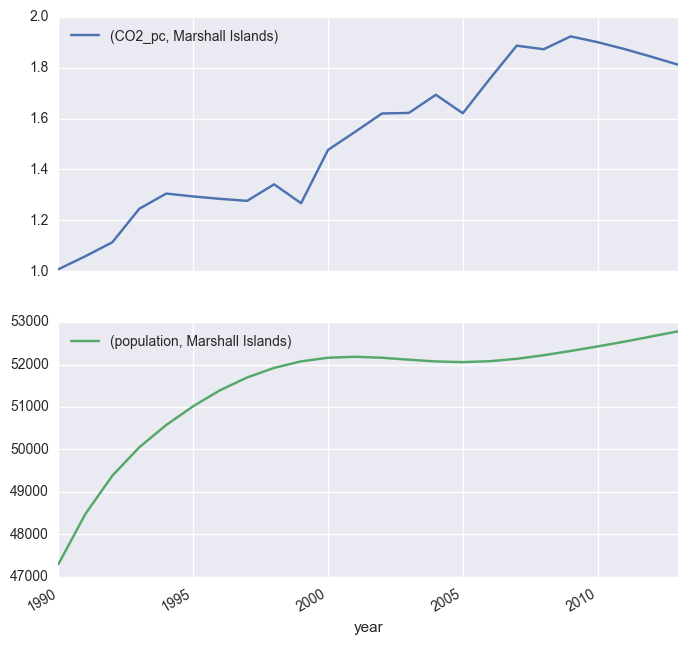

In [1255]:
# another sanity check
q = "year >= 1980 & country == 'Marshall Islands'"
vals = ['CO2_pc', 'population']
df.query(q).set_index(['country', 'year'])[vals].unstack(level=0)\
    .plot(subplots=True, figsize=(8,8));

These curves look more reasonable. Just need to fix Namibia and update footprint_df.

### Fix Namibia & update df

In [1443]:
# get location
idx = df.loc[df['country']=='Namibia'].loc[df['year']==1990].index
df.drop(idx, inplace=True)

In [1444]:
# verify
df.loc[df['country']=='Namibia'].loc[df['year']==1990]

,country,region,sub-region,year,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter,CO2footprint


In [1550]:
# recreate footprint df
q = "year == 1990 | year == 2013"
val = 'CO2footprint'
footprint_df = df.query(q).set_index(['year', 'country']).drop(['region', 'sub-region'], axis=1)[val]
footprint_df = footprint_df.unstack()

## Resume analysis

In [1446]:
# biggest % increase
topN_change(footprint_df, 2013, 'pct')

country
Equatorial Guinea    4372.68
Somalia              3300.37
Nepal                 924.76
Lao                   922.52
Benin                 719.15
Name: 2013, dtype: float64

In [1303]:
# biggest % decrease?
bottomN_change(footprint_df, 2013, 'pct')

country
North Korea   -77.65
Nauru         -65.76
Romania       -55.47
Aruba         -49.36
Bulgaria      -47.78
Name: 2013, dtype: float64

In [186]:
# The biggest absolute incr?
topN_change(footprint_df, 2013, 'diff')

country
China            7.788010e+09
India            1.415467e+09
Iran             4.059290e+08
United States    3.625781e+08
South Korea      3.455244e+08
Name: 2013, dtype: float64

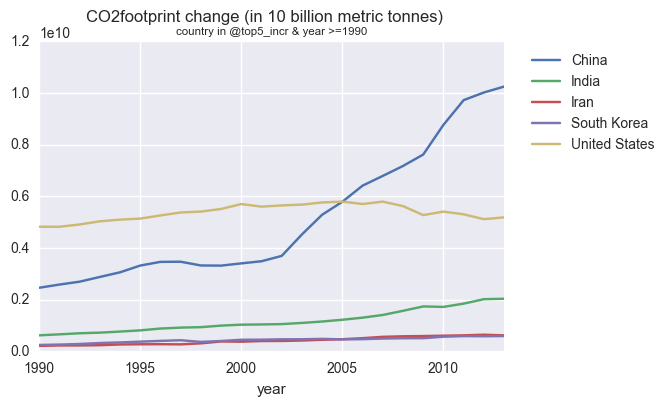

In [190]:
# plot top increases
top5_incr = topN_change(footprint_df, 2013, 'diff').index.values
q = "country in @top5_incr & year >=1990"
unit = "(in 10 billion metric tonnes)"
main_title = " ".join([val, "change", unit])

df.query(q).set_index(['year', 'country'])[val]\
    .unstack()\
    .plot()
    
plt.suptitle(main_title)
plt.title(q, fontsize='x-small')
plt.legend(loc='best', bbox_to_anchor=(1.35, 1));

In [1302]:
# and the biggest absolute decr?
bottomN_change(footprint_df, 2013, 'diff')

country
Russia           -5.401862e+08
Germany          -2.563956e+08
North Korea      -1.740604e+08
United Kingdom   -9.844260e+07
Romania          -8.811719e+07
Name: 2013, dtype: float64

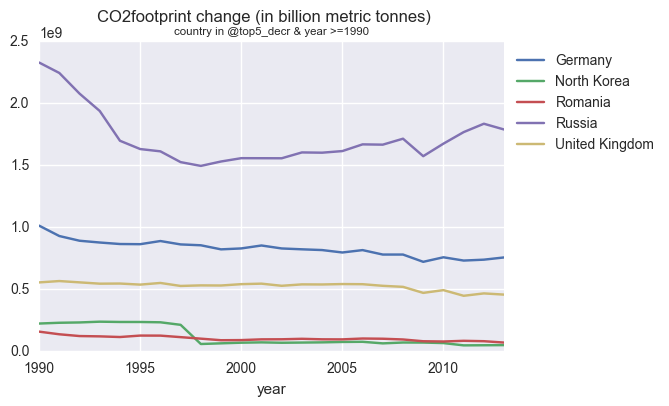

In [191]:
# plot top decreases
top5_decr = bottomN_change(footprint_df, 2013, 'diff').index.values
q = "country in @top5_decr & year >=1990"
unit = "(in billion metric tonnes)"
main_title = " ".join([val, "change", unit])

df.query(q).set_index(['year', 'country'])[val]\
    .unstack()\
    .plot()
    
plt.suptitle(main_title)
plt.title(q, fontsize='x-small')
plt.legend(loc='best', bbox_to_anchor=(1.35, 1));

In [1315]:
# what is the total CO2 footprint for 2013?
# will be used later to calculate % of totals
q = "year == 2013"
val = 'CO2footprint'
ww_footprint = df.query(q)[val].sum()
ww_footprint.round(0)

33853525731.0

In [1304]:
# what % is the 2013 footprint for top5_incr
# compared to world total?

q = "year == 2013 & country in @top5_incr"

footprints = df.query(q)[['country', val]]

pct_total = footprints[['country', val]][val]\
    .divide(ww_footprint).multiply(100)\
    .rename('% of Total')
    
pd.concat([footprints, pct_total], axis=1).sort_values('% of Total')

,country,CO2footprint,% of Total
13556,South Korea,5.924451e+08,1.750025
7531,Iran,6.169202e+08,1.822322
7295,India,2.034570e+09,6.009919
16175,United States,5.185696e+09,15.318037
3156,China,1.024853e+10,30.273161


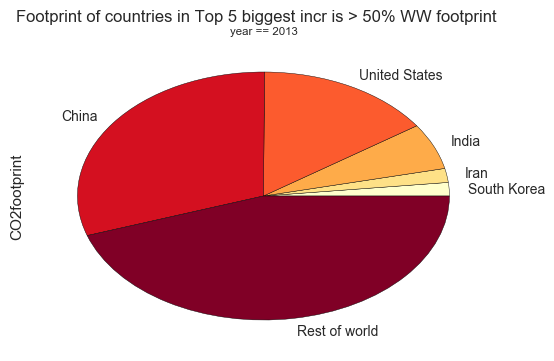

In [1305]:
# can we visualize this?

q = "year == 2013"
bigfoot_bool = df.query(q)['country']\
    .apply(lambda x: x if x in top5_incr else 'Rest of world')\
    .rename('label')
    
footprint_by_label = pd.concat([df.query(q)[['country', 'CO2footprint']], bigfoot_bool], axis=1)\
    .groupby('label').sum()
    
footprint_by_label[val].sort_values().plot(kind='pie', colormap='YlOrRd')
plt.suptitle("Footprint of countries in Top 5 biggest incr is > 50% WW footprint")
plt.title(q, fontsize='x-small');


### How many are increasing vs decreasing their footprint?

In [1306]:
# How many countries saw in incr in CO2 emissions between 1990 & 2013?
footprint_chg = footprint_df.pct_change().multiply(100).loc[2013]
footprint_chg.where(footprint_chg > 0).count()

154

In [1307]:
# what was their total footprint increase?
total_incr = footprint_chg.where(footprint_chg > 0).sum().round(0)
total_incr

33997.0

In [1308]:
# how many saw a decrease?
footprint_chg.where(footprint_chg <= 0).count()

29

In [1309]:
# what was their total footprint decrease?
total_decr = footprint_chg.where(footprint_chg <= 0).sum().round()
total_decr

-729.0

In [1310]:
# .... with a net result of 
net_chg = np.add(total_incr, total_decr)
net_chg

33268.0

In [1311]:
# the decrease offset the 
# global CO footprint increase by what percentage?
round((total_decr/total_incr * 100), 2)

-2.14

This is depressing.

But are there distinctive patterns of top-growing footprint countries vs the top-shrinking ones?

### Compare correlations

In [1312]:
# compare correlations for the two groups
countries_incr = footprint_chg.where(footprint_chg > 0).dropna().index.values
countries_decr = footprint_chg.where(footprint_chg <= 0).dropna().index.values

In [ ]:
# correlations for all incr countries
q = "year >= 1990 & country in @countries_incr"
val = 'CO2_pc'
df.query(q).corr()[val].sort_values(ascending=False)

In [ ]:
# look at log df too
val = 'log_CO2_pc'
log_df.query(q).corr()[val].sort_values(ascending=False)

In [ ]:
# correlations for all decr countries
q = "year >= 1990 & country in @countries_decr"
val = 'CO2_pc'
df.query(q).corr()[val].sort_values(ascending=False)

In [ ]:
val = 'log_CO2_pc'
log_df.query(q).corr()[val].sort_values(ascending=False)

In [ ]:
# Correlations for top 10 increasing footprint countries
q = "year >= 1990 & country in @top10_incr"
val = 'CO2_pc'

df.query(q).corr()[val].sort_values(ascending=False)

In [ ]:
# what about log values?
val = 'log_CO2_pc'

log_df.query(q).corr()[val].sort_values(ascending=False)

While there are strong correlations in both data sets, there seems to be more strong correlations with the log transformed data.


In [ ]:
plot_kws={'line_kws':{'color':'red'}, 'scatter_kws': {'alpha': 0.5}}
sns.pairplot(log_df.query(q).drop(['year'], axis=1),\
             kind='reg', diag_kind='kde', plot_kws = plot_kws);

In [ ]:
# any different for the shrinking footprint group?
q = "year >= 1990 & country in @top10_decr"
val = 'CO2_pc'

df.query(q).corr()[val].sort_values(ascending=False)

The correlations are noticeably lower than those for the top increasing-footprint countries.

Let's look at the log correlations.

In [ ]:
# what about log values?
val = 'log_CO2_pc'

log_df.query(q).corr()[val].sort_values(ascending=False)

The strongest correlations for the log df are still weaker than those of the original columns.

In [ ]:
# stick with original df when looking at decreasing-footprint countries
q = "year >= 1990 & country in @top10_decr"
sns.pairplot(df.query(q).drop(['year'], axis=1), 
             kind='reg', diag_kind='kde', plot_kws = plot_kws);

In [ ]:
# regional differences?
df.query(q).groupby('region').corr()[val].sort_values(ascending=False).unstack(level=0)

In [ ]:
df.query(q).groupby('region')['country'].unique().apply(lambda x: len(x))

In [ ]:
s = df.query(q).groupby('region')['country'].unique()
s.apply(", ".join)

In [ ]:
# regional differences?
df.query(q).groupby('region').corr()[val].sort_values(ascending=False).unstack(level=0)

In [ ]:
# how many countries in each of these regions?
df.query(q).groupby('region')['country'].unique().apply(lambda x: len(x))

In [ ]:
q = "year >= 1990 & country in @top10_incr"
val = 'CO2footprint'

df.query(q).corr()[val].sort_values(ascending=False)

In [ ]:
q = "year >= 1990 & country in @countries_incr"
val = 'CO2footprint'

df.query(q).corr()

In [ ]:
q = "year == 2013"
df.query(q).set_index('country')['CO2footprint'].sort_values(ascending=False).head(20)

In [ ]:
top5_ttl_incr + top5_ttl_decr

In [ ]:
q = "year >= 1950"
kind = 'Regions'
val = 'CO2footprint'

annual_totals = df.query(q).groupby(['region','year']).sum()[val]
annual_totals.unstack(level=0).loc[1950:].plot()

plt.suptitle(" ".join([kind, val, unit]))
plt.title(q, fontsize='x-small');

In [ ]:
# 2013 total CO2 footprint for Europe
q = "year==@end_yr & region=='Europe'"
total_2013 = df.query(q)['CO2footprint'].sum()
total_2013

q = "year==1990 & region=='Europe'"
total_1990 = df.query(q)['CO2footprint'].sum()
total_1990

(total_2013-total_1990)/total_1990

In [ ]:
# how does this compare to other regions?
q = "year==@end_yr"
total_2013 = df.query(q).groupby('region')['CO2footprint'].sum()
total_2013

q = "year==1990"
total_1990 = df.query(q).groupby('region')['CO2footprint'].sum()
total_1990

(total_2013-total_1990)/total_1990

## heatmaps

In [233]:
# analyze with heatmap
q = "year >= 1990 & country in @countries_decr"



In [234]:
# create heatmap df
#colname_dict = shorten_colnames(df.query(q), ['year'])
hm_df = df.query(q).set_index('year').drop(['region', 'sub-region', 'country'], axis=1)\
    #.rename(columns=colname_dict)


# normalize & plot
normalized_df=(hm_df-hm_df.min())/(hm_df.max()-hm_df.min())
normalized_df.iplot(kind='heatmap', colorscale='YlOrRd', title=str.upper(q))

In [ ]:
# what are the correlations for each region?
corr_df = df.query(q).groupby('region').corr().unstack()[val]
#corr_df.style.apply(highlight_max)
corr_df

In [ ]:
mask_lower = abs(corr_df) < .6 # hide weak correlations
corr_df.mask(mask_lower)

In [ ]:
# how much do these correlations vary by region?
corr_df.std().sort_values()

In [ ]:
# get cols where at least 1 region 
# has corr > .6 or < -.6
high_corr_var = corr_df.mask(mask_lower).dropna(how='all', axis=1).columns.values.tolist()
high_corr_var

In [ ]:
def correlate_this(df, val):
    '''returns a correlation
    matrix for va'''
    corr_df = df.corr().unstack()[val].drop(val, axis=1)
    mask_lower = abs(corr_df) < .6 # hide weak correlations
    print "ALL CORRELATIONS:"
    print corr_df
    print "\n"
    print "GREATER THAN 0.6:"
    print corr_df.mask(mask_lower).dropna(how='all', axis=1)
   
    return corr_df
        
grp_df = df.groupby(['region'])
corr_df = correlate_this(grp_df, val)


In [ ]:
# plot scatter matrix
from pandas.plotting import scatter_matrix

# variables
q = "region=='Europe' & year >= 1950"
idx =  ['year', 'CO2footprint']

# shorten column names for legibility in scatter matrix
colnames_dict = shorten_colnames(df.query(q), idx)
sm_df = df.query(q).set_index(idx).rename(columns = colnames_dict)

# plot
scatter_matrix(sm_df, figsize=(10,10), alpha=0.2, grid=True)
plt.suptitle(q);

In [ ]:
# compare with other regions

#subset = df['region']=='Asia'
q = "year >= 1950 & region=='Oceania'"
#sm_df = df.query(q).loc[subset].set_index(['year', 'CO2footprint']).rename(columns = colnames_dict['columns'])

sm_df = df.query(q).set_index(['year', 'CO2footprint']).rename(columns = colnames_dict['columns'])

scatter_matrix(sm_df, figsize=(10,10), alpha=0.2, grid=True);

In [ ]:
# correlations by region
df.query(q).groupby('region').corr()[val].unstack().T\
.drop(['year','CO2footprint', val]).style.apply(highlight_max)

In [ ]:
corr_df = df.groupby('region').corr()[val].unstack().T\
.drop(['year','CO2footprint', val])

#corr_df.style.apply(color_negative_red, axis=1)
mask = corr_df.style.applymap(color_negative_red)
mask

### Observations

#### Energy, then Income have highest correlation with CO2 p.c. emissions

Motor vehicle ownership & HDI also show strong correlations. 
Kids surviving to 35 have a moderate negative correlation overall, and a strong negative correlation for Oceania.

Another exception for Oceania is sulfur emissions: it has the highest correlation with CO2 emissions for Oceania, whereas it is small everwhere else.

But to what extent are HDI scores, vehicle ownership, and surviving kids (i.e. family size) just proxies for income? 

## Is there a lot of variation in correlations within regions?

In [ ]:
# further break down CO2 correlation matrix by sub_region
co2_corr = df.query(q).groupby(['region', 'sub-region']).corr()[val]
co2_corr = co2_corr.unstack(level=(0,1))

In [ ]:
# heatmaps by region
q = "year == 2010" # last year of data for energy production
val = 'log_CO2_pc'
valcols = log_df.columns[4:]

for region in df['region'].unique():   
    hm_df = log_df.query(q).loc[df['region']==region].set_index('country')[valcols]
    normalized_df=(hm_df-hm_df.min())/(hm_df.max()-hm_df.min())
    
    normalized_df.sort_values(val).dropna(how='all', axis=1)\
        .iplot(kind='heatmap', colorscale='Spectral', title=str.upper(region))

## Compare countries with incr vs decr footprints

Are there any discernible differences between these two groups?

In [1512]:
## helper functions

def append_col(df, col):
    new_df =pd.concat([df, col], axis=1)
    return new_df

def calc_change(df, intervals=1):
    '''calculates % change between 
    specified row interval'''
    str_cols = df.set_index(['country','year']).select_dtypes(exclude='number')
    change_df = df.set_index(['country','year'])\
        .select_dtypes(include='number')\
        .pct_change(intervals).multiply(100).round(2)\
        .add_prefix('chg%_')
    
    change_df = append_col(change_df, str_cols)
    return change_df

# normalize rows between [1,-1] for heatmaps
def norm_pos_neg(df):
    '''normalize positive & negative values 
    between [1,-1]'''
    str_df = df.select_dtypes(exclude='number')
    num_df = df.select_dtypes(include='number')
    mins = abs(num_df.min())
    maxes = num_df.max()
    neg = num_df.mask(num_df > 0).div(mins) # create df of normalized neg've values
    pos = num_df.mask(num_df < 0).div(maxes) # create df of normalized pos'iti've values
    combo_df = pos.fillna(neg)
    return append_col(combo_df, str_df)

# need shorter column names for legibility
#def shorten_colnames(df, index_cols):


### Heatmap of % change for all vars

In [1481]:
# calculate % change between start & end years
# for all numeric columns
start = 1990
end = 2013
q = "year==@start | year ==@end"

# pad nans, for each country, calc % change
xform = df.fillna(method='ffill').query(q).groupby(['country'])\
    .transform(lambda x: x.pct_change().multiply(100).round(2))

# join original country & year columns transformed columns
# then drop the all-NaN 'start' rows
new_df = df.query(q).loc[xform.index.values][['country', 'year']]\
    .join(xform, rsuffix="_r").drop('year_r', axis=1)\
    .set_index(['country', 'year'])\
    .dropna(how='all').reset_index('year', drop=True)\
    .reset_index('country')

In [1530]:
def create_member_labs(series, group, true_lab, false_lab):
    member_labs = series.apply(lambda x: true_lab if x in group else false_lab)\
    .rename(true_lab + "_or_" + false_lab)
    return member_labs

In [1533]:
q = "year >= 1990"
trend_bool = create_member_labs(df['country'], 
                                group = countries_incr, 
                                true_lab = 'incr', 
                                false_lab = 'decr')

trend_bool.head()

0    incr
1    incr
2    incr
3    incr
4    incr
Name: incr_or_decr, dtype: object

In [1546]:
# append to df
new_df = append_col(df, trend_bool)
new_df.head()

,country,region,sub-region,year,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,...,incr_or_decr,incr_or_decr,incr_or_decr,incr_or_decr,incr_or_decr,incr_or_decr,incr_or_decr,incr_or_decr,incr_or_decr,incr_or_decr
0,Afghanistan,Asia,Southern Asia,1949,0.00182,NaN,NaN,NaN,1030.0,NaN,...,incr,incr,incr,incr,incr,incr,incr,incr,incr,incr
1,Afghanistan,Asia,Southern Asia,1950,0.01088,NaN,NaN,NaN,1040.0,NaN,...,incr,incr,incr,incr,incr,incr,incr,incr,incr,incr
2,Afghanistan,Asia,Southern Asia,1951,0.01169,NaN,NaN,NaN,1060.0,NaN,...,incr,incr,incr,incr,incr,incr,incr,incr,incr,incr
3,Afghanistan,Asia,Southern Asia,1952,0.01155,NaN,NaN,NaN,1070.0,NaN,...,incr,incr,incr,incr,incr,incr,incr,incr,incr,incr
4,Afghanistan,Asia,Southern Asia,1953,0.01323,NaN,NaN,NaN,1120.0,NaN,...,incr,incr,incr,incr,incr,incr,incr,incr,incr,incr


In [1519]:
# create column to flag if country has incr or decr emissions since 1990

# create series of labels
trend_bool = new_df['country']\
    .apply(lambda x: 'increasing' if x in countries_incr else 'decreasing')\
    .rename('CO2since1990')

# add to existing df
co2_trend = append_col(new_df, trend_bool)


In [1484]:
co2_trend.set_index('country', inplace=True)
co2_trend.head()

,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter,CO2footprint,CO2since1990
country,,,,,,,,,,,
Afghanistan,219.94,NaN,NaN,61.36,74.04,NaN,-47.76,154.26,NaN,713.47,increasing
Albania,3.20,-20.21,-47.30,19.84,130.26,NaN,-76.06,-12.13,41.41,-9.32,decreasing
Algeria,16.85,29.76,10.10,28.42,30.39,-31.34,231.51,47.37,-83.98,72.20,increasing
Angola,201.17,25.87,96.39,-38.00,41.00,54.71,-68.72,110.72,-62.28,534.62,increasing
Antigua And Barbuda,19.97,6.93,0.00,48.39,15.24,0.00,0.00,45.36,57.14,74.39,increasing


In [1458]:
# sort variable columns by correlation with CO2footprint
val = 'CO2footprint'
sort_order = df.fillna(method='ffill').query('year == @end').corr()[val].sort_values(ascending=False).index.values
sort_order = np.flip(sort_order, 0)
sort_order

array(['year', 'gas_price_liter', 'energy-prod_pc', 'gini_idx',
       'military_%gdp', 'income_pc', 'energy-use_pc', 'hdi', 'CO2_pc',
       'population', 'CO2footprint'], dtype=object)

In [1477]:
# why normalization is needed
co2_trend.groupby('CO2since1990').agg(['min', 'max'])

CO2_pc          energy-use_pc         energy-prod_pc          \
                min      max           min     max            min     max   
CO2since1990                                                                
decreasing   -75.51    11.15        -53.85  105.99         -47.30  160.47   
increasing   -56.98  2103.79        -85.01  348.94         -98.96  700.00   

                hdi        income_pc          gini_idx        military_%gdp  \
                min    max       min      max      min    max           min   
CO2since1990                                                                  
decreasing    -9.42  16.79    -73.21   117.76   -48.54  43.64        -79.56   
increasing   -52.21  90.16    -48.11  3270.00   -49.53  92.42        -99.51   

                     population         gas_price_liter          CO2footprint  \
                 max        min     max             min      max          min   
CO2since1990                                                                    
decreasing    200.78     -16.03  101.93          -50.59   440.74       -70.29   
increasing    390.57     -53.86  359.82          -97.75  3726.09       -27.50   

                       
                  max  
CO2since1990           
decreasing      64.90  
increasing    3766.62

In [1517]:
## helper functions

def sort_cols_by_corr(df, val):
    '''returns columns in order from highest to lowest
    correlation with val, for sorting index (y-axis) of heatmap.'''
    sort_order = df.corr()[val].sort_values().index.values
    return sort_order

def shorten_colnames(df):
    '''shortens column names to first word, 
    assuming underscore (_) separates words.'''
    cols = df.columns
    newcols = pd.Series(cols).apply(str.split, args=('_')).apply(lambda x: x[0])
    newcols_dict = pd.Series(index=cols, data=newcols.values)\
        .to_dict()
    return newcols_dict

def plotly_heatmap(df, title, val, colors = 'Spectral'):
    '''select numeric cols from df, sort x-axis by val, 
    & shorten names for legibility then plot.'''
    df = df.select_dtypes('number')
    
    # get new names & sort order for cols
    sort_order = sort_cols_by_corr(df, val)
    shortnames = shorten_colnames(df)
    
    # make df more legible for plot
    df = df.reindex(sort_order, axis=1)\
    .sort_values(val)\
    .dropna(how='all', axis=1)\
    .rename(columns=shortnames)
    
    df.iplot(
        kind='heatmap', 
        colorscale=colors, 
        title=title
    )

In [1514]:
val = 'CO2footprint'
title = "Pct changes (normalized) %d-%d, sort by %s" % (start, end, val)
hm_df = norm_pos_neg(co2_trend)

plotly_heatmap(hm_df, title, val)

In [1516]:
val = 'hdi'
title = "Pct changes (normalized) %d-%d, sort by %s" % (start, end, val)
hm_df = norm_pos_neg(co2_trend)

plotly_heatmap(hm_df, title, val)

For me, the biggest story in these two heatmaps is `hdi`. 

While it is overall increasing for both groups, it's markedly stronger in countries with a shrinking `CO2footprint`. Most interesting of all,  bigger increases in `hdi` seemed to correlate with bigger drops in `CO2footprint`. Granted, with only 29 countries in this group, the sample is small.

Note that `income_pc` (which is correlated with `hdi`) is also increasing in the shrinking-footprint countries, while it appears to be either unchanged or barely increasing in the increasing-footprint nations. 

I get the impression that for increasing-footprint countries, population is increasing faster and more consistently than in the shrinking-footprint countries, and in general increases in intensity in parallel with `CO2footprint`. 

However at the either end of this spectrum, `CO2_pc` is changing faster than population. The 3 countries where `CO2footprint` also had the fastest-increasing `CO2_pc`. 

At the other end, there's more variation in `CO2_pc` decreases. However in general it's decreasing the fastest in the countries where `CO2footprint` is barely changing and, not coincidentally, population growth is still generally positive but slower.

In [1461]:
# correlation of changes
co2_trend.groupby('CO2since1990').corr()[val].round(2).unstack()

,CO2_pc,CO2footprint,energy-prod_pc,energy-use_pc,gas_price_liter,gini_idx,hdi,income_pc,military_%gdp,population
CO2since1990,,,,,,,,,,
decreasing,0.79,1.0,0.14,0.50,-0.24,0.06,0.20,0.37,-0.08,0.27
increasing,0.97,1.0,-0.02,0.31,0.07,-0.06,-0.09,0.71,0.11,0.14


In [1462]:
# look at normed df
co2_trend_norm.groupby('CO2since1990').corr()[val].round(2).unstack()
#agg([np.mean, np.std]).round(2)

,CO2_pc,CO2footprint,energy-prod_pc,energy-use_pc,gas_price_liter,gini_idx,hdi,income_pc,military_%gdp,population
CO2since1990,,,,,,,,,,
decreasing,0.87,1.0,0.28,0.67,-0.14,0.02,0.24,0.69,0.01,0.21
increasing,0.80,1.0,0.05,0.26,-0.02,-0.02,-0.12,0.37,0.08,0.10


In [1200]:
co2_trend.groupby('CO2since1990').agg([np.mean, np.std]).round(2)

CO2_pc         energy-use_pc        energy-prod_pc         \
                mean     std          mean    std           mean    std   
CO2since1990                                                              
decreasing    -33.61   20.02         -2.92  28.46           1.64  42.78   
increasing    131.75  415.34         37.41  67.85          18.73  78.45   

                hdi        income_pc         gini_idx        military_%gdp  \
               mean    std      mean     std     mean    std          mean   
CO2since1990                                                                 
decreasing    10.18   7.11     26.54   43.11    -4.47  21.27        -17.14   
increasing    17.19  24.16     80.11  263.73     3.77  23.98         -9.44   

                    population        gas_price_liter         CO2footprint  \
                std       mean    std            mean     std         mean   
CO2since1990                                                                 
decreasing    57.57      17.68  32.43           59.78  126.64       -25.13   
increasing    91.35      56.99  50.90           45.69  408.71       265.84   

                      
                 std  
CO2since1990          
decreasing     19.97  
increasing    720.15

# Conclusions

## CO2 analysis

* Not surprisingly, per capita CO2 emissions are usually highly correlated with per capita income & energy consumption, and to a lesser extent, motor vehicle ownership & HDI score.

* There were intriguing outliers in Europe, all tiny countries: Luxembourg, Faroe Islands, Gibraltar & Estonia. Several Carribean countries had very high CO2 p.c. emissions. Some avenues worth exploring:
    * Is this because their tiny size forces them to import most goods, including dirtier fuels? 
    * Many of these countries are quite wealthy. More flights taken? Higher yacht ownership? 


## Multi-variate analysis
* For multi-variate analysis, regional (continents) comparisions almost useless: too much noise within regions due to extreme outliers and unequal distribution of (wealthy) countries within sub-regions. Prime examples:
    * Americas: Northern Americas,  
    * Oceania:  Australia & New Zealand
    * Asia: Western Asia, which includes most of the OPEC countries
* Log transform of negatively-skewed data revealed some strong positive correlations, notably `log_CO2_pc` with `hdi`.

## Ideas to pursue further:

* how much of Europe's declining CO2 rates were due to Phase 1 Kyoto targets (higher for the EU than elsewhere), and how much were due to the fallout from the 2008 financial crisis, as they both in effect from 2008 to 2012?
* on a similar note, how many countries saw increasing income_pc or hdi while also experiencing decreasing CO2_pc?
* Find out what & when measures were put in place to reduce CO2 emissions in declining-emissions countries, if any. 
